# Table of Contents

- [Initalize](#Initalize)
- [Wrangle](#Wrangle)
- [EDA](#Explore-Data-Analysis-(EDA))
  - [Visualizations](#Visualization)
    - [En Masse](#En-Masse)
    - [Insightful](#Insightful-Visualizations)
- [Clustering](#Clustering)
- [Hypthosis Testing](#Hypthosis-Testing)
  - [Choosen Features](#Choosen-Features)
- [Modeling](#Modeling)
- [Results and Summary](#Results-&-Conclusion)
- [Next Steps](#Next-Steps)

# Initalize

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
import sklearn.preprocessing
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error, explained_variance_score
from sklearn.linear_model import LinearRegression, LassoLars, TweedieRegressor, Ridge
from sklearn.preprocessing import PolynomialFeatures
from math import sqrt


import scipy.stats as stats

from zillow_wrangle import wrangle_zillow

import warnings
warnings.filterwarnings("ignore")
print('Success')

Success


## Wrangle

All the prep/wrangle work is handled by the wrangle_zillow() function imported above. For a broad overview of the wrangle function use help(wrangle_zillow). For a more indpeth overview, see the [README](https://github.com/datastraine/zillow-cluster-project/blob/main/README.md).

***Note:*** I choose eliminate any outlier that was greater than the split difference between the max and the 3rd quantile as there were over 1000 rows of outliers and this eliminated the most extreme upper bound cases leaving more rows intact. 


Jump to [Table of Content](#Table-of-Contents), [Wrangle](#Wrangle), [Visualizations](#Visualization), [Clustering](#Clustering), [Hypthosis Testing](#Hypthosis-Testing), [Choosen Features](#Choosen-Features), [Modeling](#Modeling), [Results and Summary](#Results-&-Conclusion), [Next Steps](#Next-Steps)

In [2]:
help(wrangle_zillow)

Help on function wrangle_zillow in module zillow_wrangle:

wrangle_zillow()
    Loads zillow data and then fliters it where propertylandusetypeid is 260, 261, 262, 263, 264, 265, 268, 275, 276, or 279.
    Drops unnecessary id columns and any duplicated columns.    
    Creates a has_pool column where poolcnt = 1.
    Creates a has_basement column where basementsqft > 0.
    Creates a taxdollar_per_lotsqft  feature.
    Creates taxdollar_per_strcturesqft feature.
    Creates a more_than_two_bath feature
    Replaces nan values with 'none' for heatingorsystemdesc
    Replaces nan values with 0 for hashottuborspa. This was done because the only values were nan or 1
    Drops calculatedbathnbr, fullbathcnt, finishedsquarefeet12, fullbathcnt, propertycountylandusecode, 
        propertylandusedesc, and transactiondate columns.
    Drops columns where the percentage of missing data is over 40%
    Drops rows where the percentage of missing data is over 50%
    Eliminates outliers above the 

In [3]:
# Import the train, validate, test data sets
train, validate, test = wrangle_zillow()
# Print the shapes and the head for a quick overview
print(f"Shapes of: \n train - {train.shape}, \n validate - {validate.shape}, \n test - {test.shape}")
train.head()

Shapes of: 
 train - (28542, 28), 
 validate - (9520, 28), 
 test - (9517, 28)


,bathroomcnt,bedroomcnt,buildingqualitytypeid,calculatedfinishedsquarefeet,fips,hashottuborspa,latitude,longitude,lotsizesquarefeet,rawcensustractandblock,...,landtaxvaluedollarcnt,taxamount,censustractandblock,logerror,heatingorsystemdesc,has_pool,has_basement,taxdollar_per_lotsqft,taxdollar_per_strcturesqft,more_than_two_bath
0,3.0,4.0,8.0,1886.0,6037.0,0.0,33995302.0,-117862467.0,4739.0,6.037403e+07,...,343966.0,7029.45,6.037403e+13,0.063948,Central,0,0,119.97,301.45,1
1,1.0,3.0,4.0,781.0,6037.0,0.0,33923672.0,-118199712.0,4199.0,6.037540e+07,...,120900.0,4149.23,6.037540e+13,0.033547,Floor/Wall,0,0,72.64,390.52,0
2,2.5,3.0,6.0,1668.0,6059.0,0.0,33906322.0,-117838323.0,6630.0,6.059022e+07,...,130508.0,3860.42,6.059022e+13,-0.003185,None,0,0,48.72,193.67,1
3,2.0,3.0,6.0,1285.0,6037.0,0.0,34241445.0,-118490429.0,7683.0,6.037117e+07,...,240910.0,4984.82,6.037117e+13,0.027104,Central,0,0,52.96,316.67,0
4,2.0,4.0,6.0,2127.0,6059.0,0.0,33846527.0,-117821752.0,7770.0,6.059022e+07,...,496844.0,6824.16,6.059022e+13,0.132053,None,1,0,81.60,298.07,0


# Explore Data Analysis (EDA)

## Visualization

### En Masse

We'll begin our EDA by creating some basic scatter plot visualizations, en masse, using logerror as the y value, and fips, buildingqualitytypeid, yearbuilt, or regionidcity for hue. 

* For Y Values we'll use logerror (our target)

* For our x values, we'll use:
>'bathroomcnt', 'bedroomcnt', 'calculatedfinishedsquarefeet', 'lotsizesquarefeet','roomcnt', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt', landtaxvaluedollarcnt', 'taxamount', 'taxdollar_per_lotsqft', 'taxdollar_per_strcturesqft', 

* For Z as hue we'll use:
>'fips', 'buildingqualitytypeid', 'regionidcity', 'regionidcounty', 'regionidzip', 'yearbuilt', 'heatingorsystemdesc',  'more_than_two_bath'

Any [insightful visualizations](#Insightful-Visualizations) that were found to be useful were created seperately and plotted below.

**Jump to** [Table of Content](#Table-of-Contents), [Wrangle](#Wrangle), [Visualizations](#Visualization), [Clustering](#Clustering), [Hypthosis Testing](#Hypthosis-Testing), [Choosen Features](#Choosen-Features), [Modeling](#Modeling), [Results and Summary](#Results-&-Conclusion), [Next Steps](#Next-Steps)

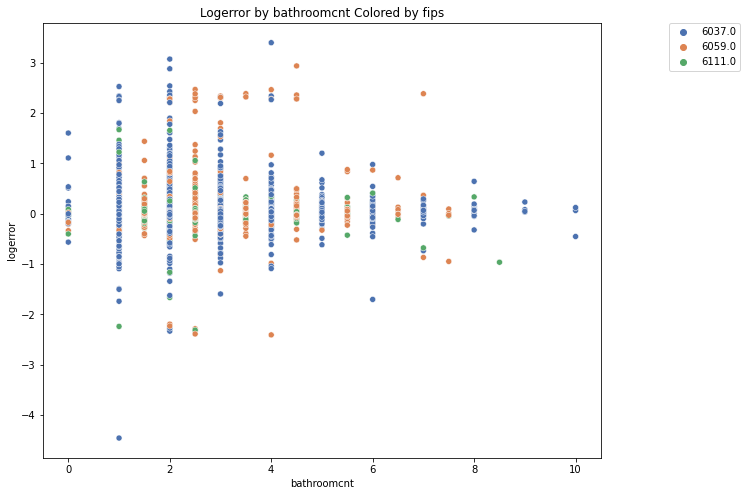

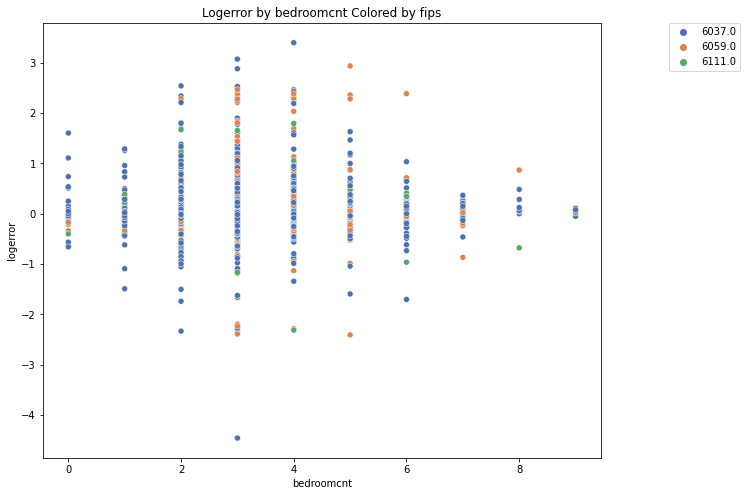

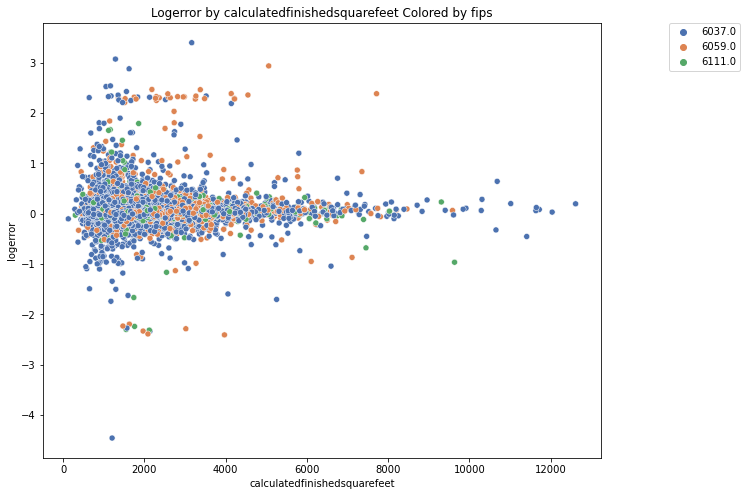

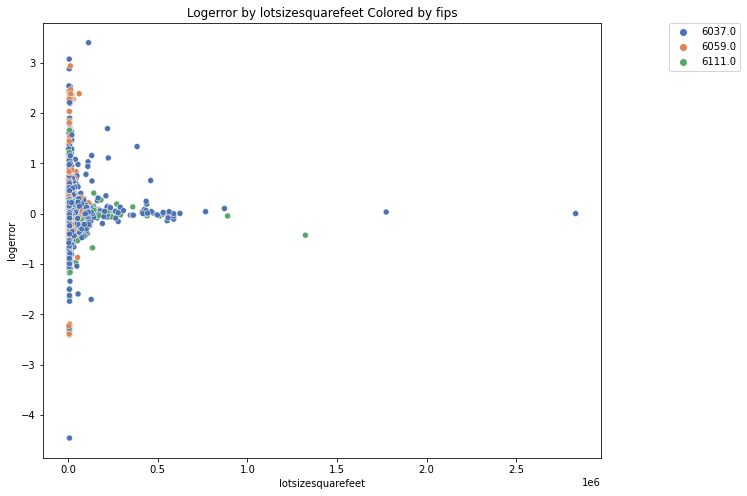

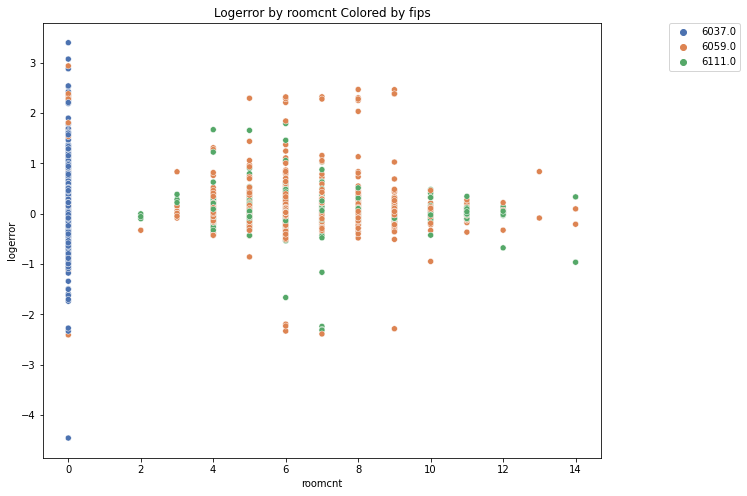

...

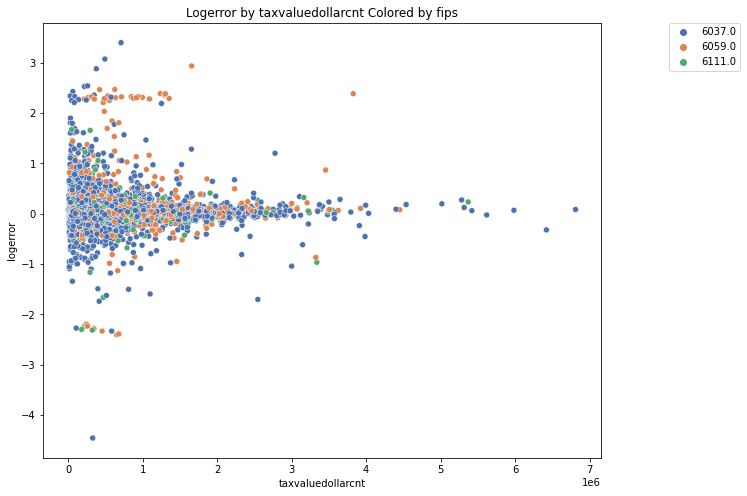

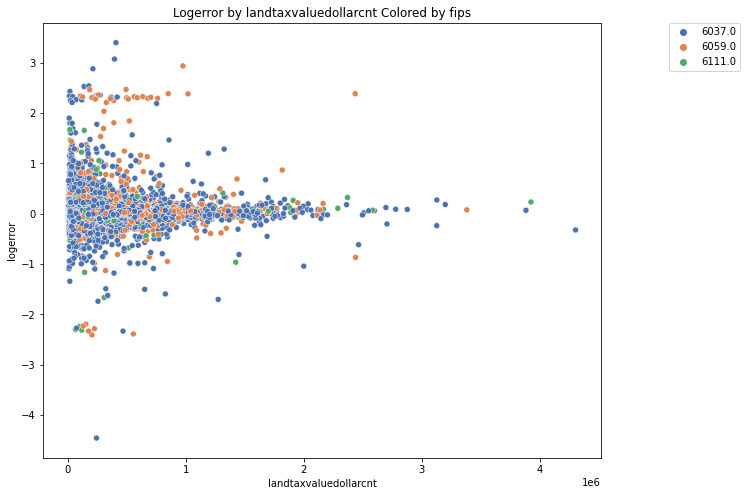

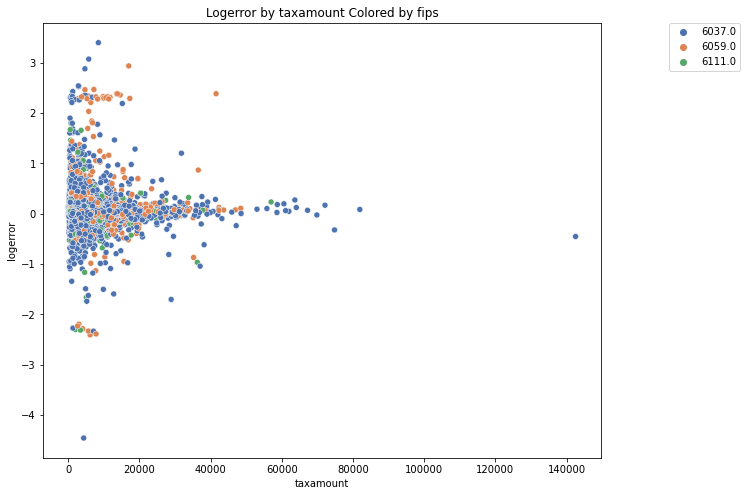

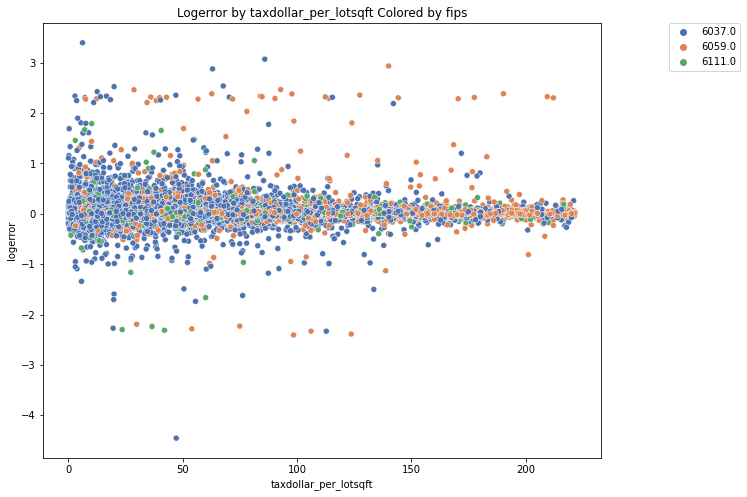

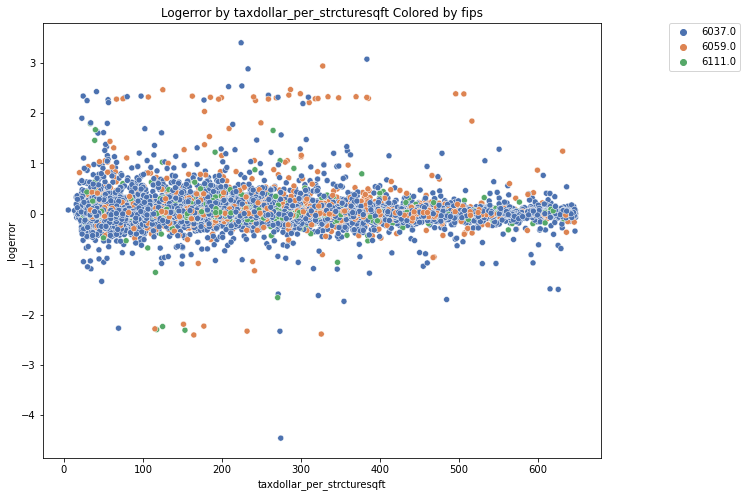

In [4]:
columns = ['bathroomcnt', 'bedroomcnt', 'calculatedfinishedsquarefeet', 'lotsizesquarefeet', 'roomcnt', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt', 'landtaxvaluedollarcnt', 'taxamount', 'taxdollar_per_lotsqft', 'taxdollar_per_strcturesqft']

for col in columns:
    plt.figure(figsize=(10,8))
    sns.scatterplot(data=train, x=col, y='logerror', hue='fips', palette='deep')
    plt.title(f"Logerror by {col} Colored by fips")
    plt.legend(bbox_to_anchor=(1.25, 1),borderaxespad=0)


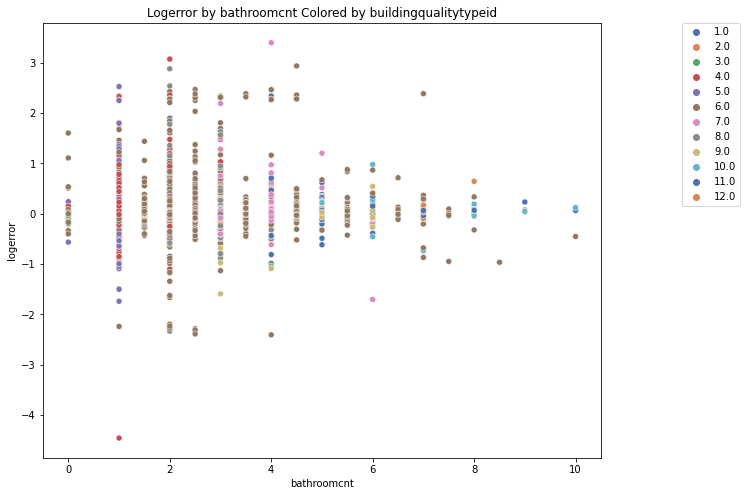

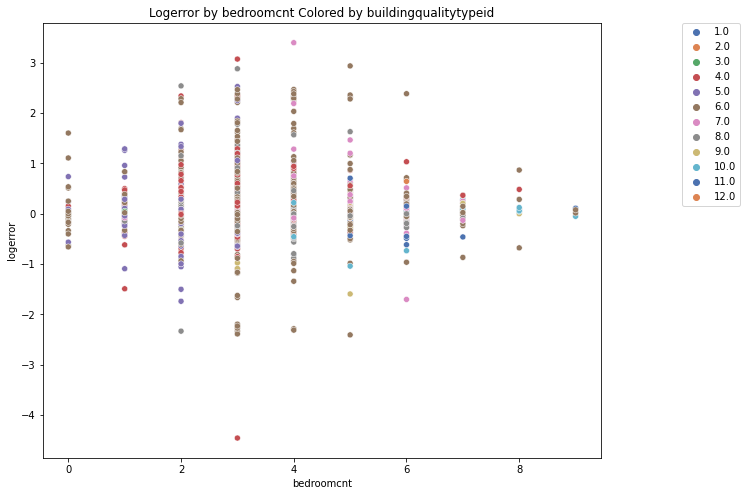

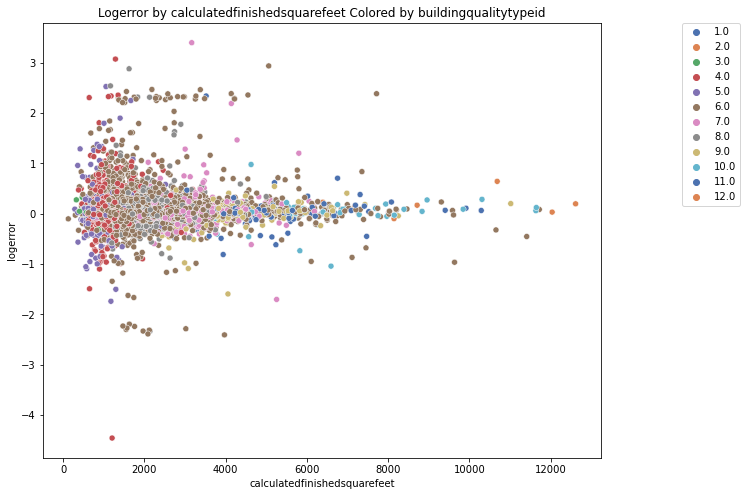

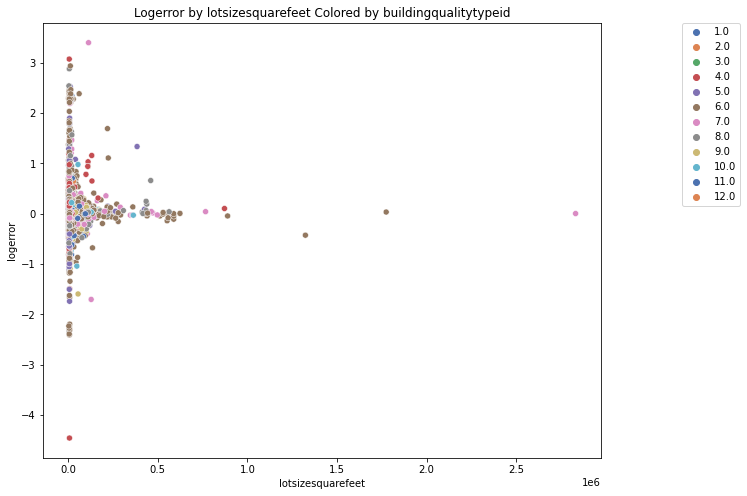

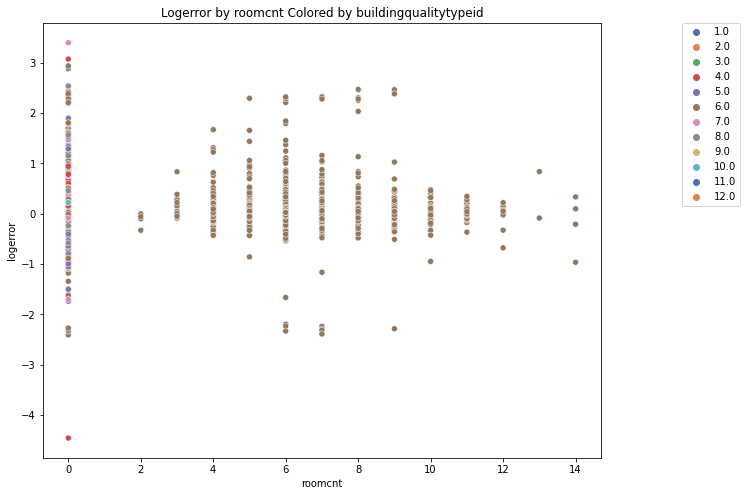

...

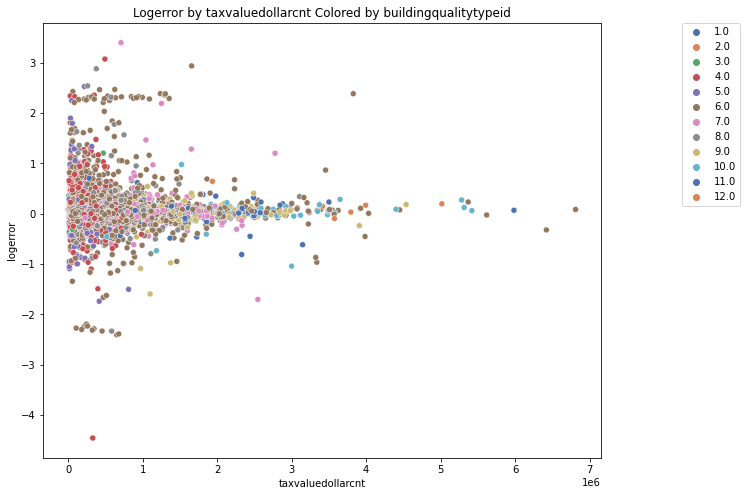

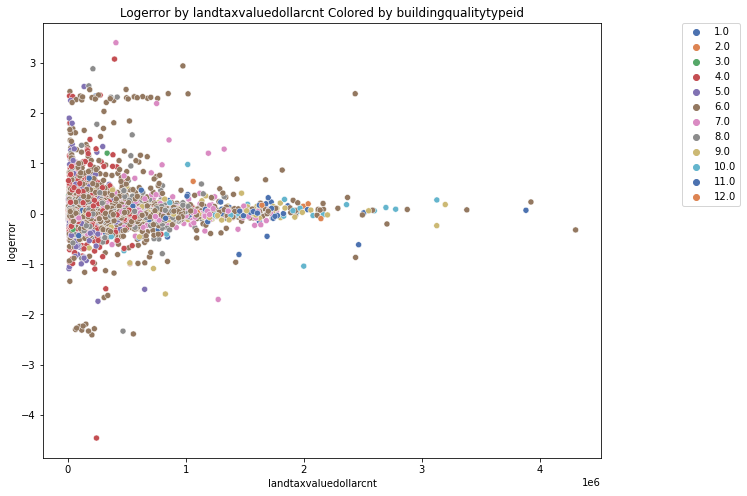

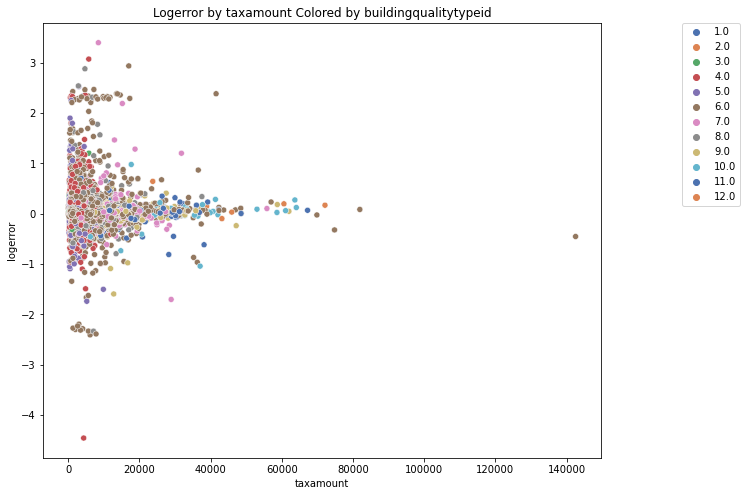

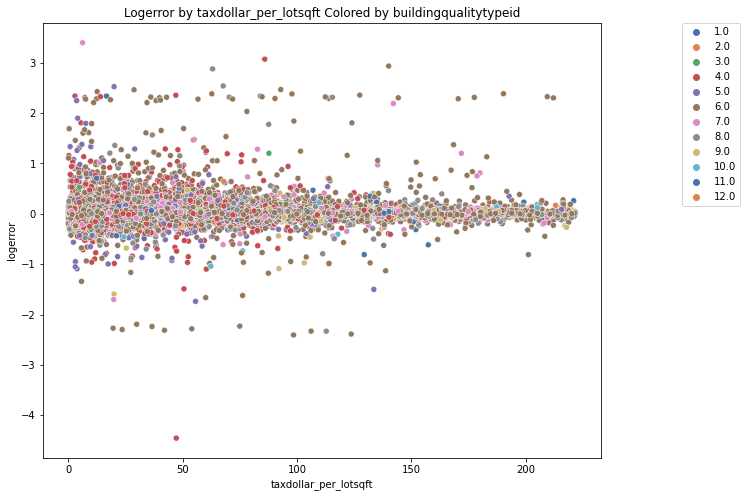

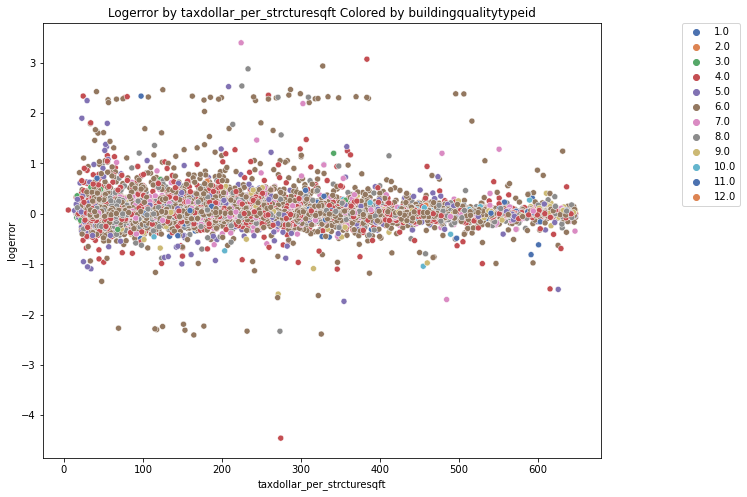

In [5]:
for col in columns:
    plt.figure(figsize=(10,8))
    sns.scatterplot(data=train, x=col, y='logerror', hue='buildingqualitytypeid', palette='deep')
    plt.title(f"Logerror by {col} Colored by buildingqualitytypeid")
    plt.legend(bbox_to_anchor=(1.25, 1),borderaxespad=0)


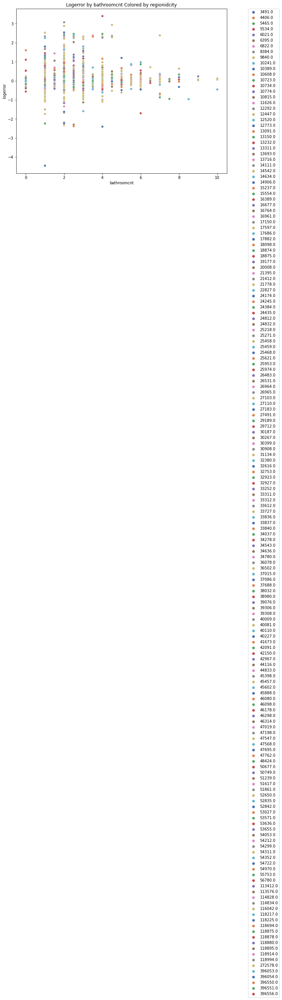

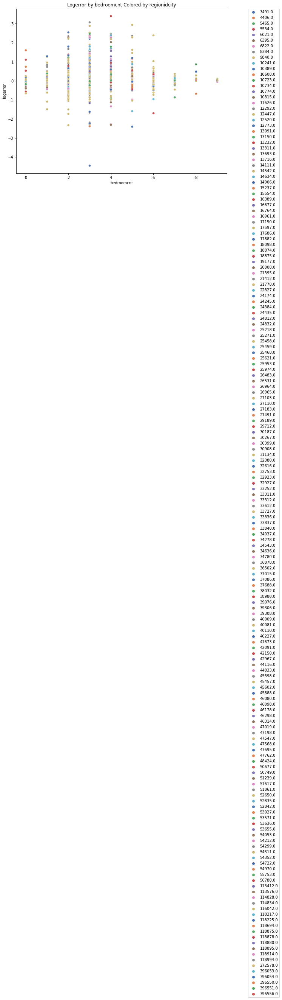

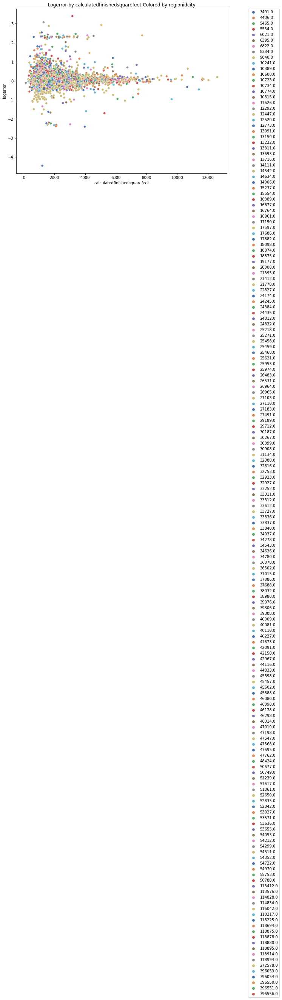

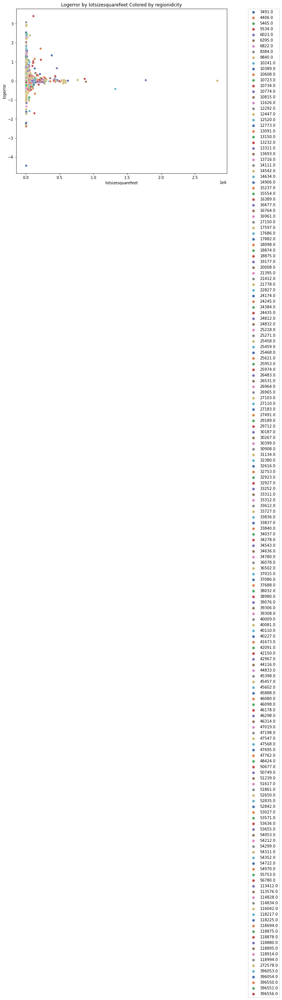

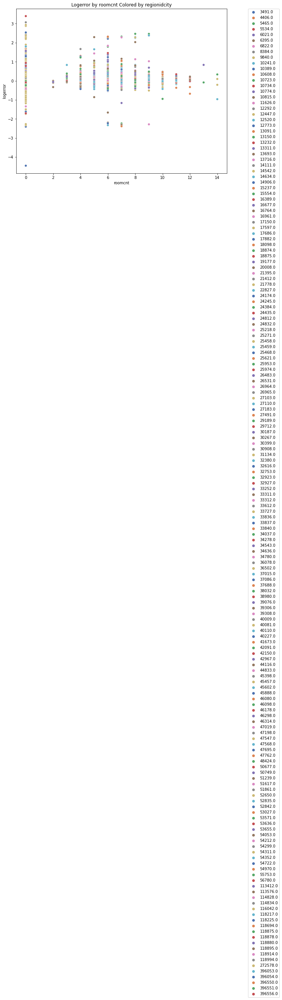

...

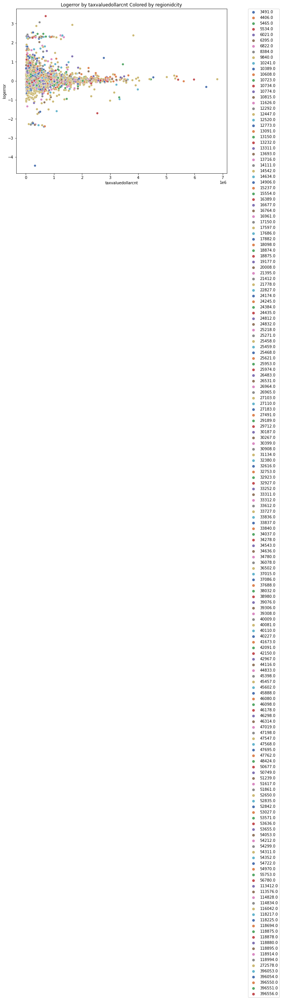

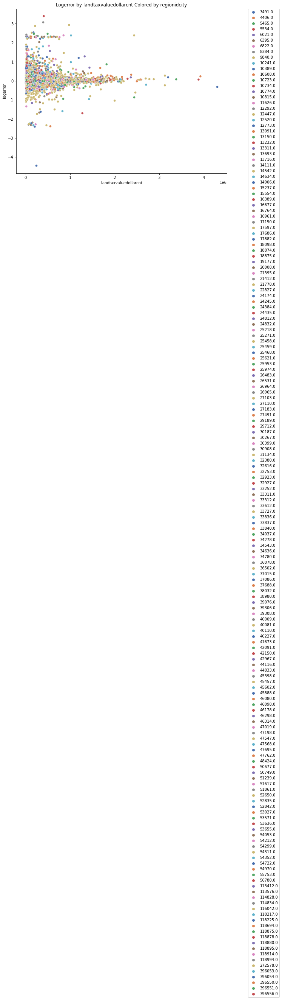

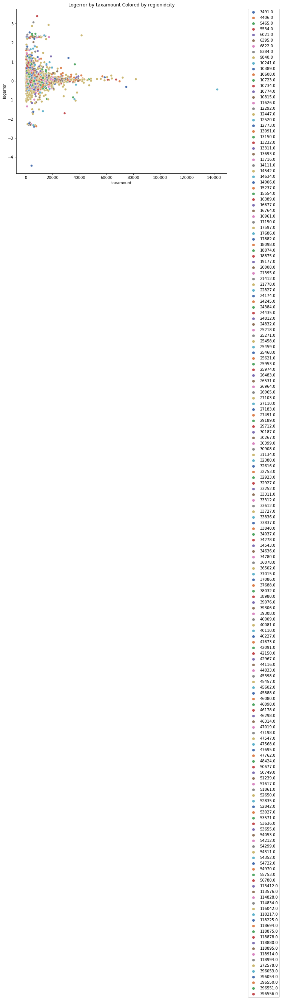

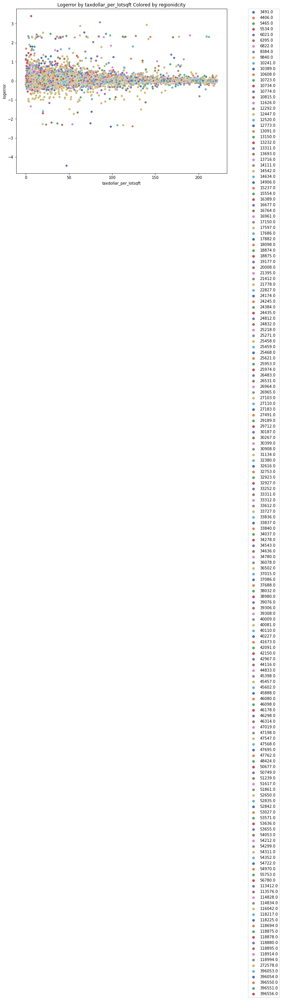

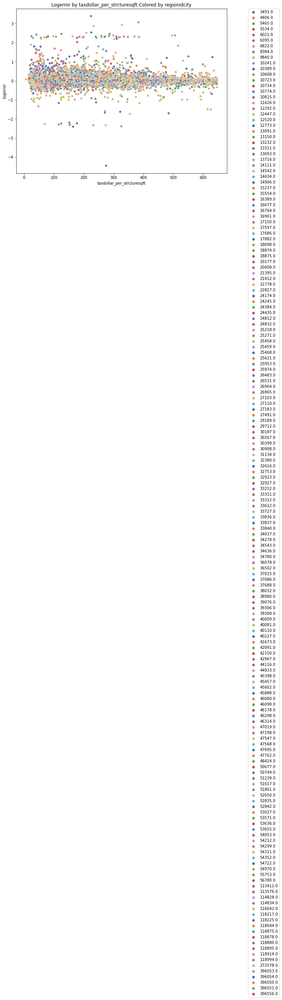

In [6]:
for col in columns:
    plt.figure(figsize=(10,8))
    sns.scatterplot(data=train, x=col, y='logerror', hue='regionidcity', palette='deep')
    plt.title(f"Logerror by {col} Colored by regionidcity")
    plt.legend(bbox_to_anchor=(1.25, 1),borderaxespad=0)

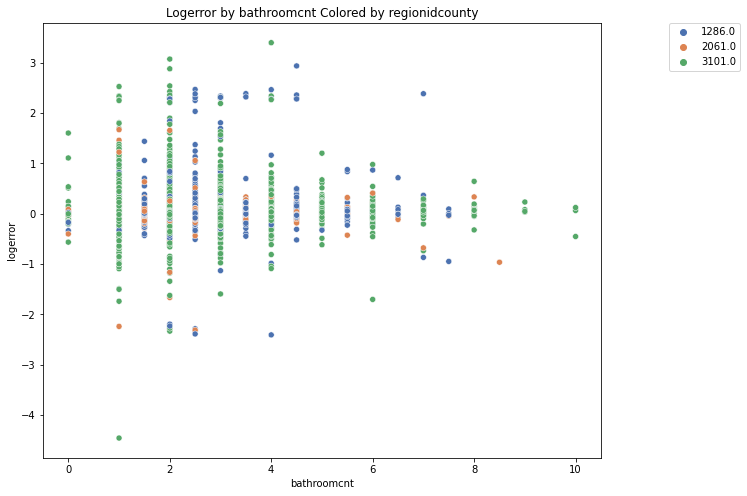

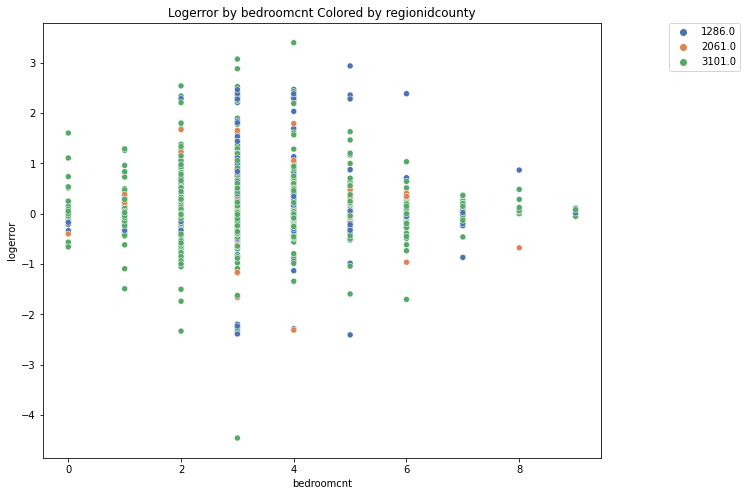

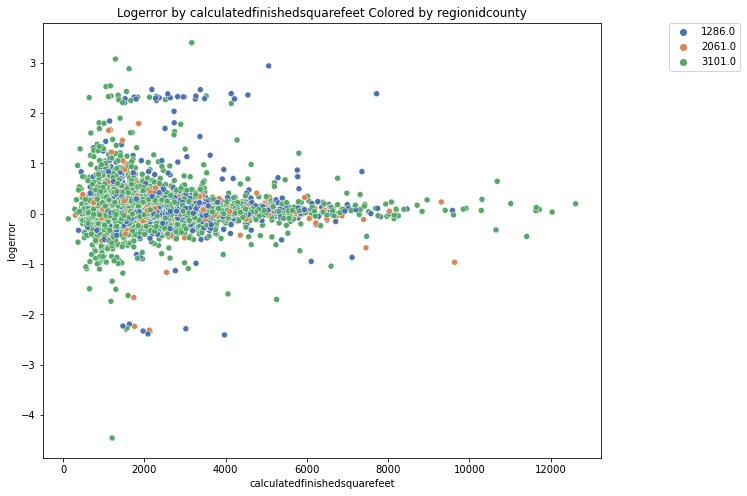

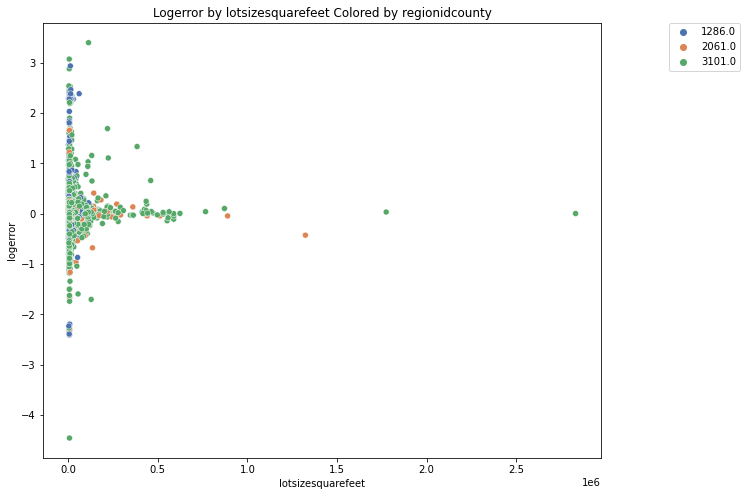

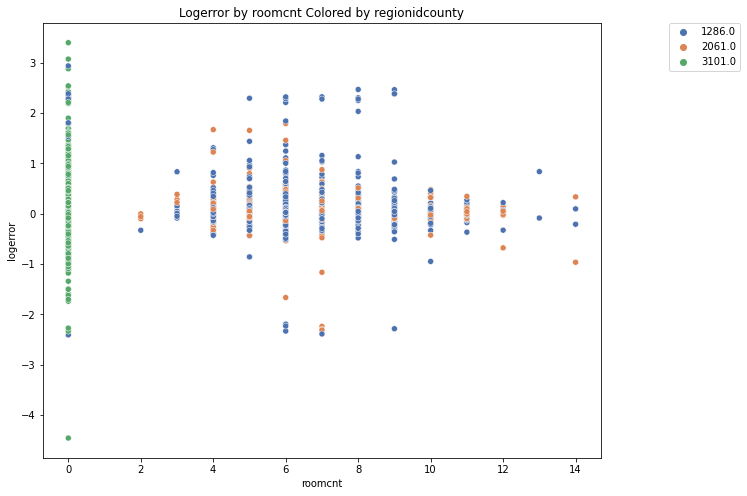

...

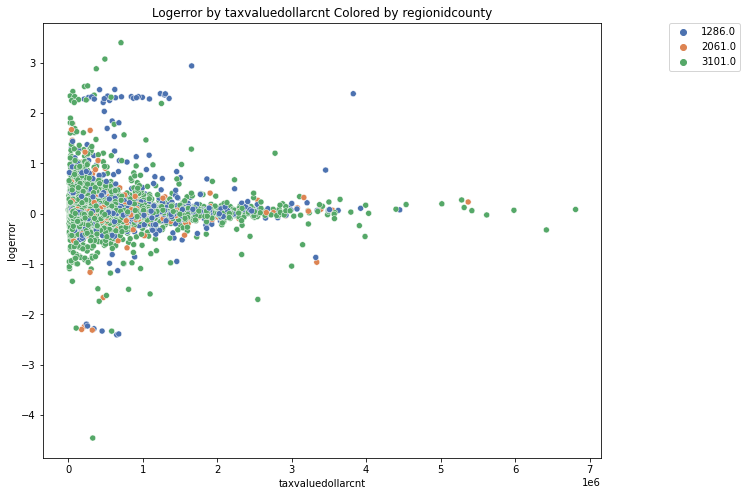

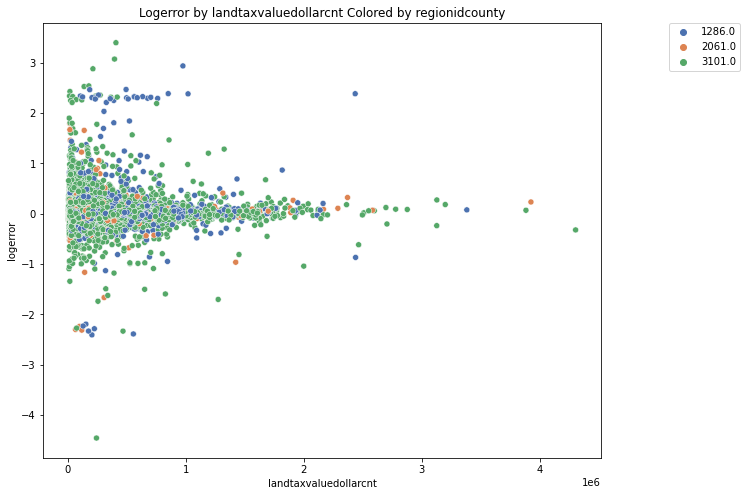

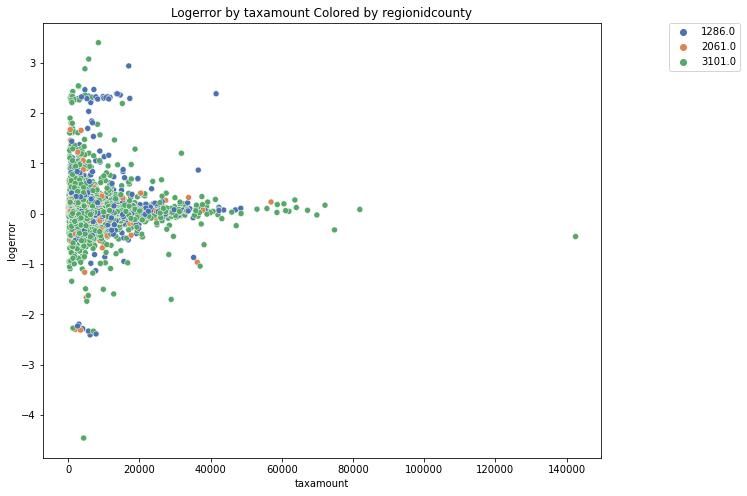

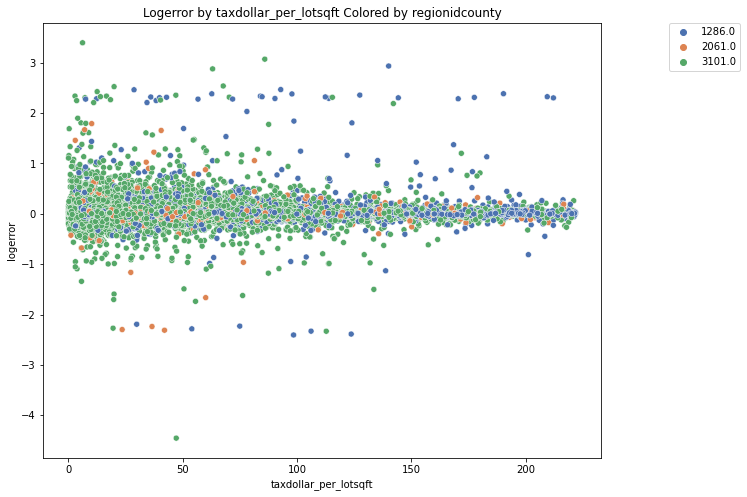

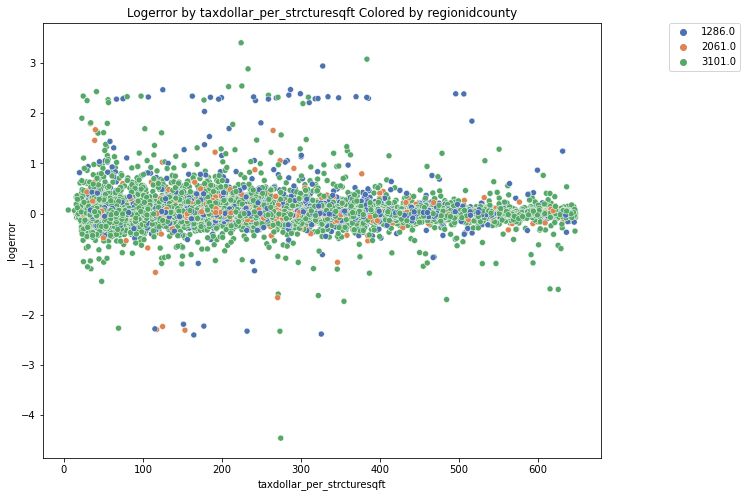

In [7]:
for col in columns:
    plt.figure(figsize=(10,8))
    sns.scatterplot(data=train, x=col, y='logerror', hue='regionidcounty', palette='deep')
    plt.title(f"Logerror by {col} Colored by regionidcounty")
    plt.legend(bbox_to_anchor=(1.25, 1),borderaxespad=0)

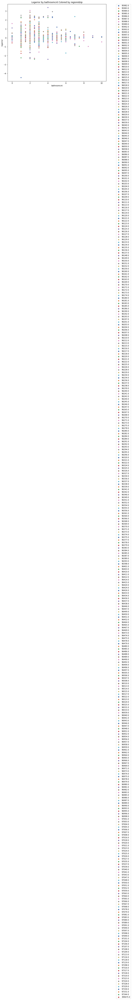

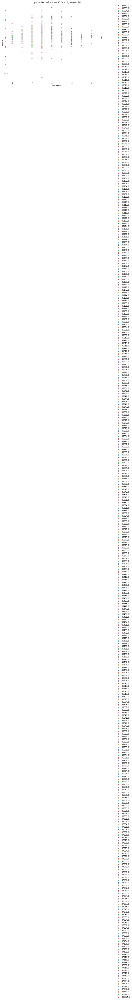

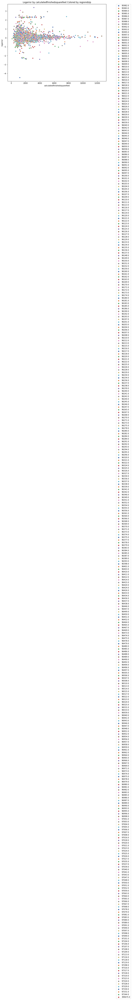

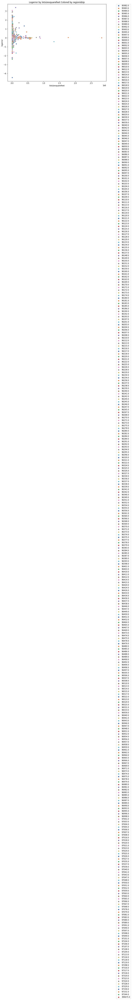

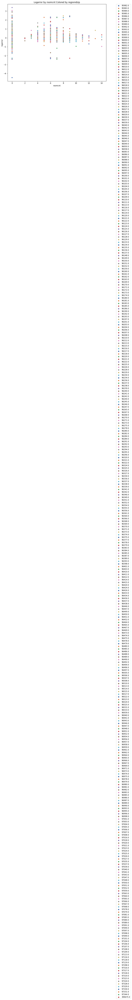

...

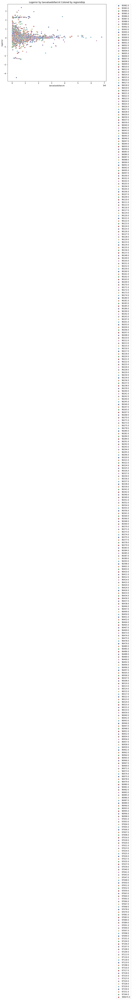

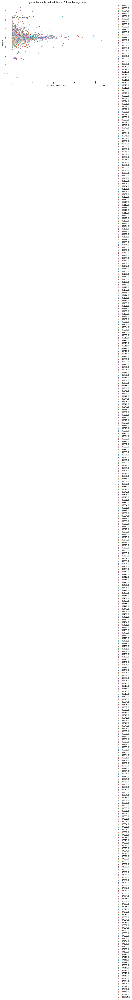

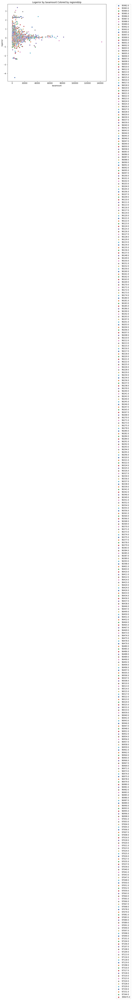

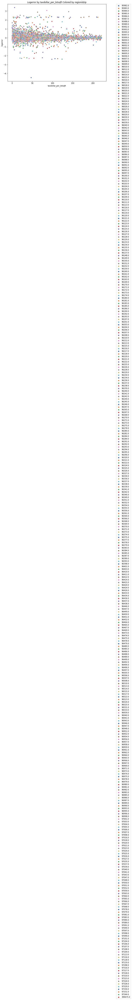

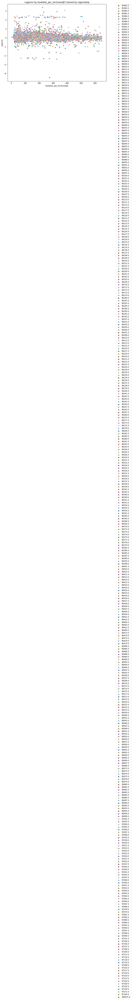

In [8]:
for col in columns:
    plt.figure(figsize=(10,8))
    sns.scatterplot(data=train, x=col, y='logerror', hue='regionidzip', palette='deep')
    plt.title(f"Logerror by {col} Colored by regionidzip")
    plt.legend(bbox_to_anchor=(1.25, 1),borderaxespad=0)

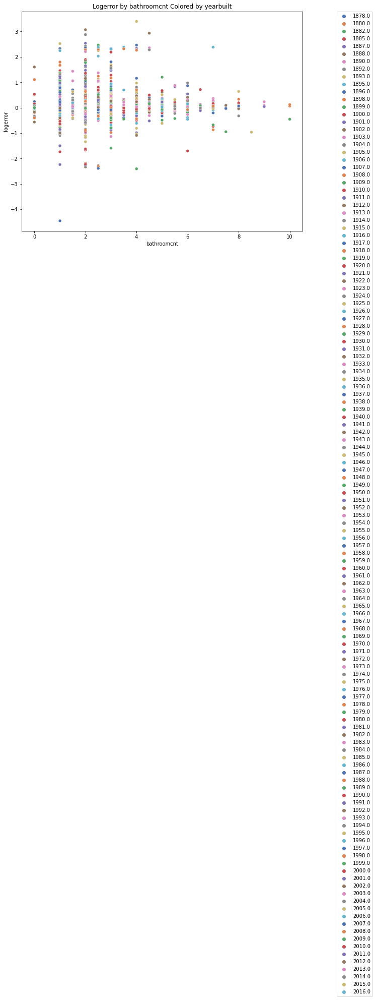

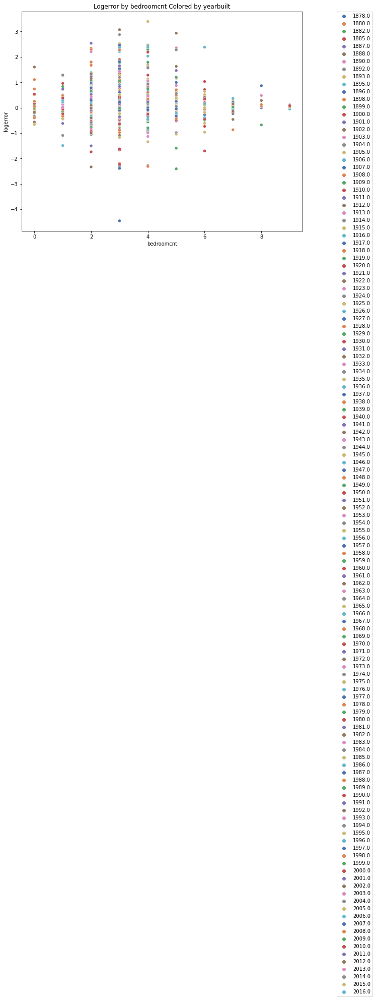

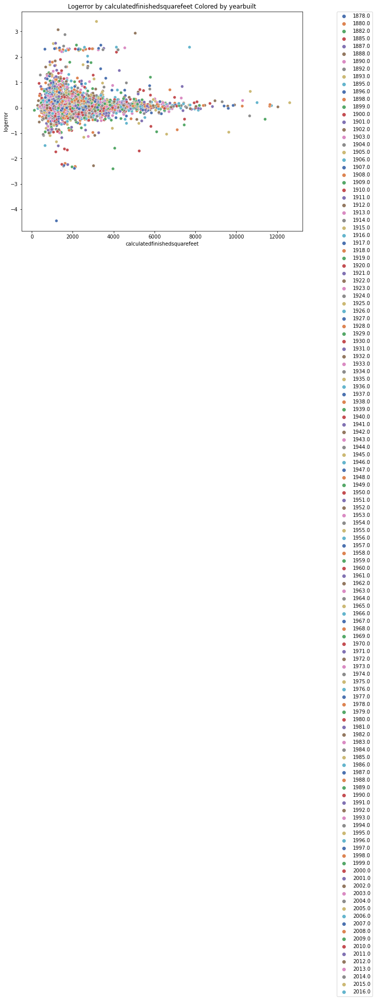

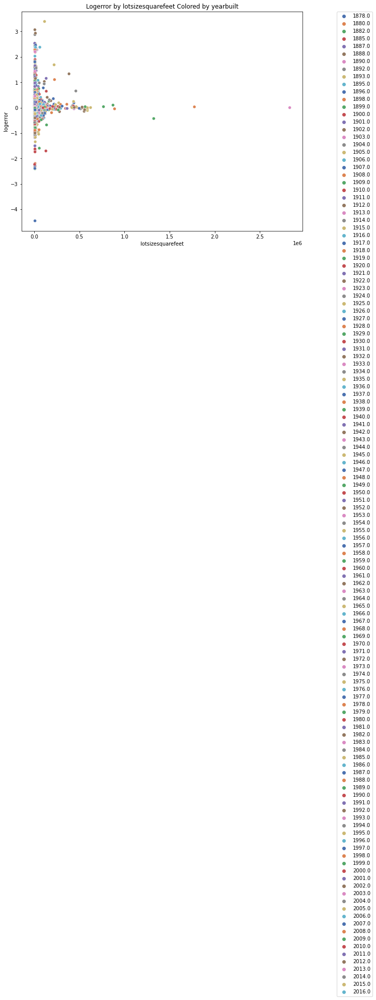

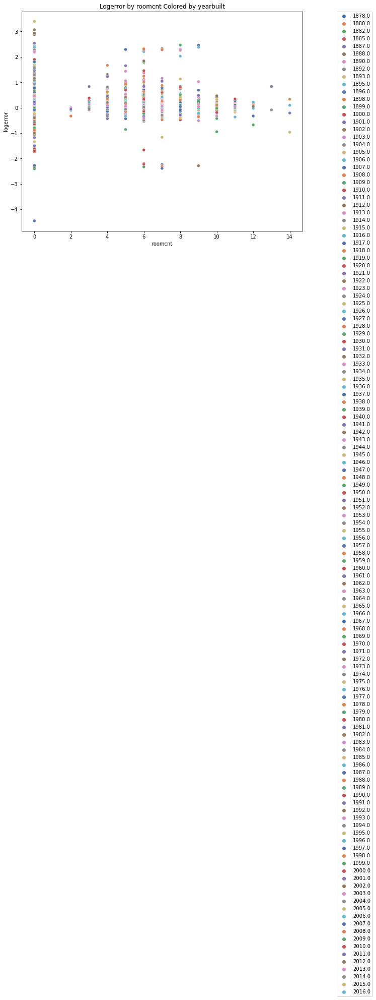

...

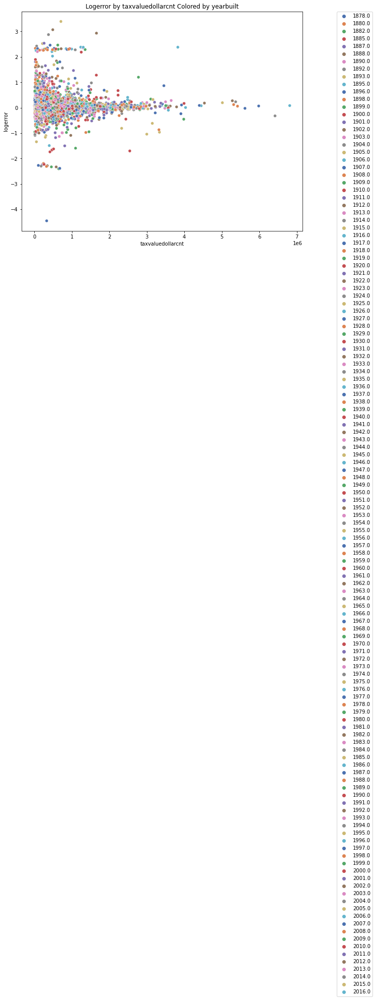

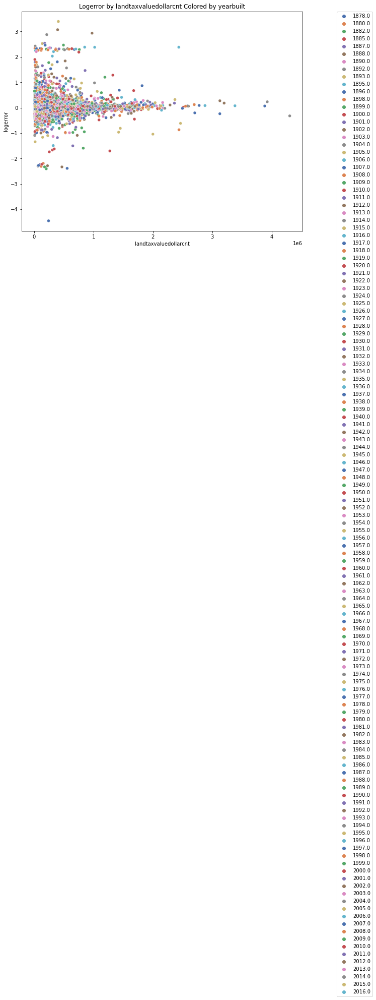

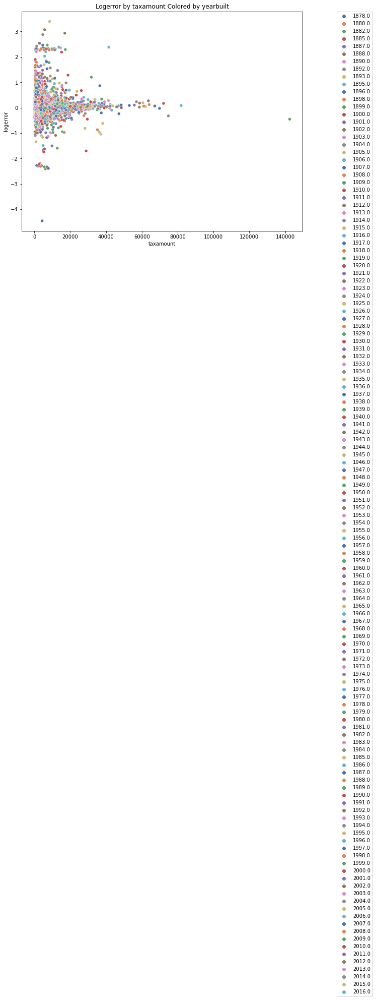

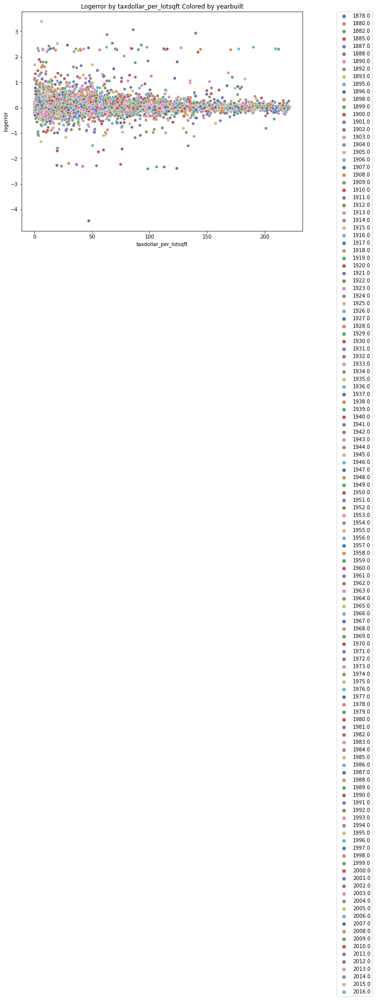

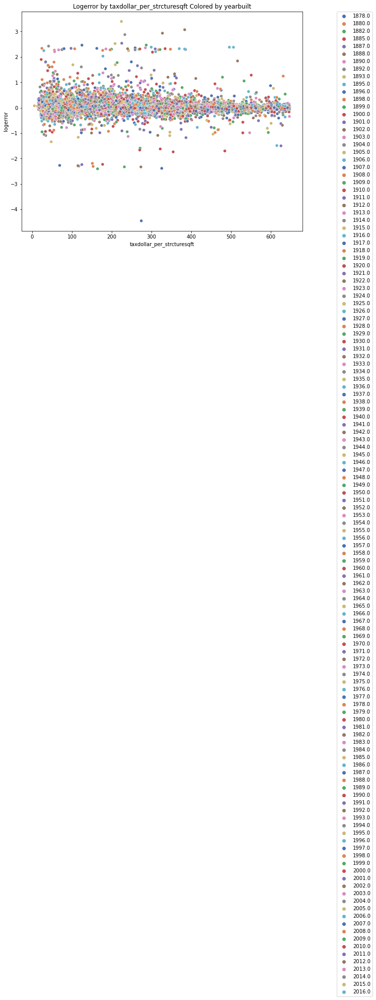

In [9]:
for col in columns:
    plt.figure(figsize=(10,8))
    sns.scatterplot(data=train, x=col, y='logerror', hue='yearbuilt', palette='deep')
    plt.title(f"Logerror by {col} Colored by yearbuilt")
    plt.legend(bbox_to_anchor=(1.25, 1),borderaxespad=0)

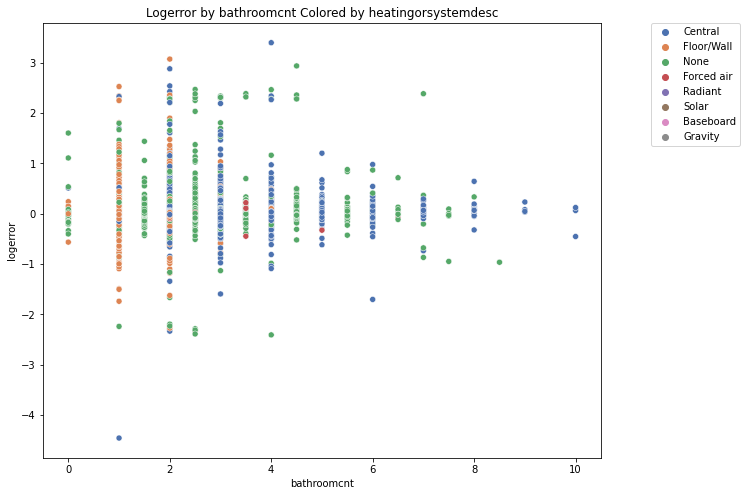

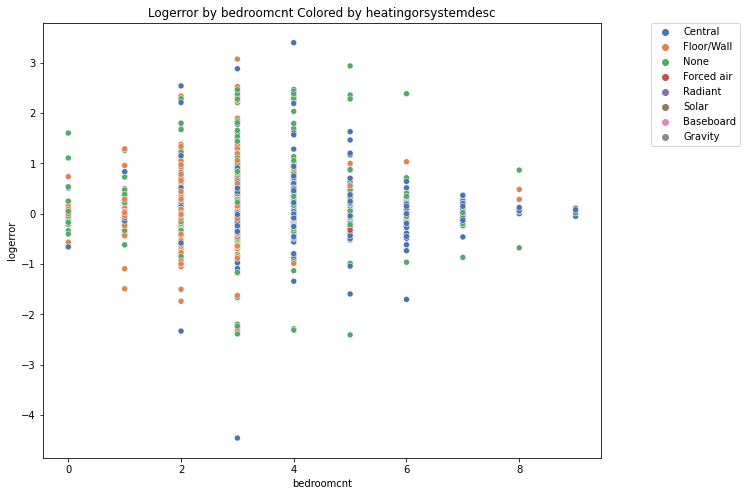

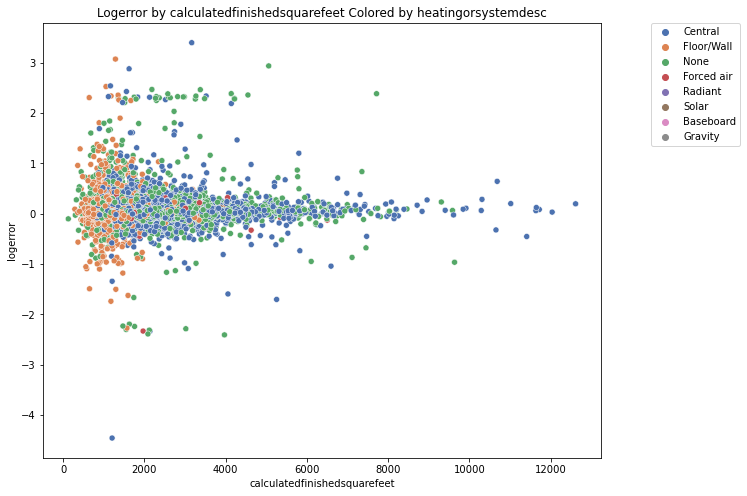

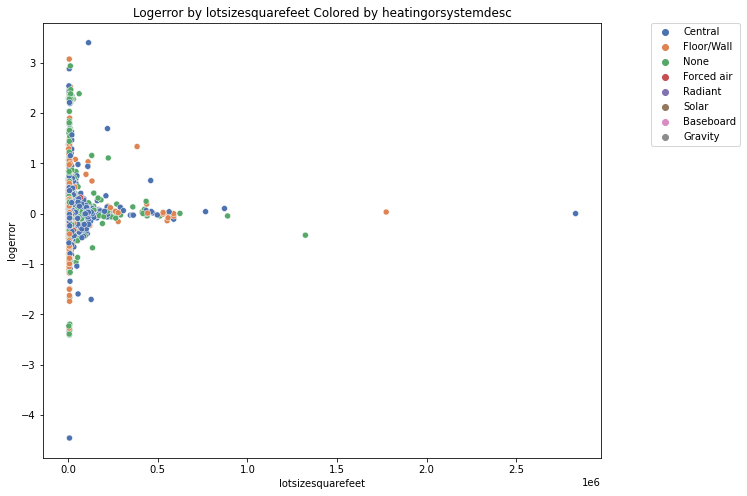

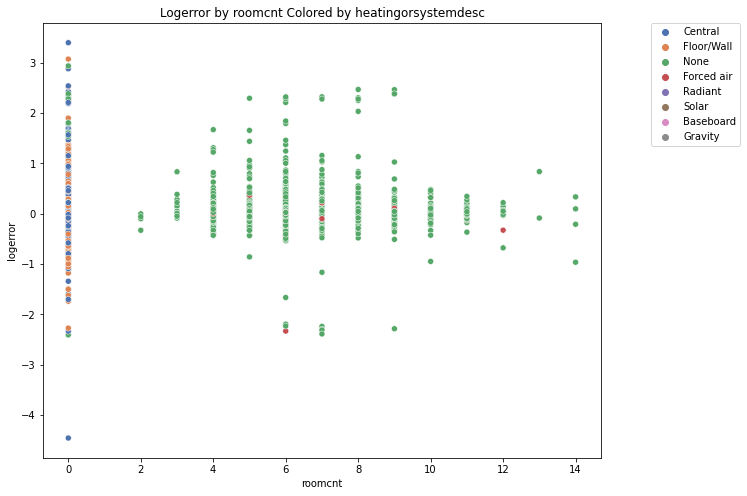

...

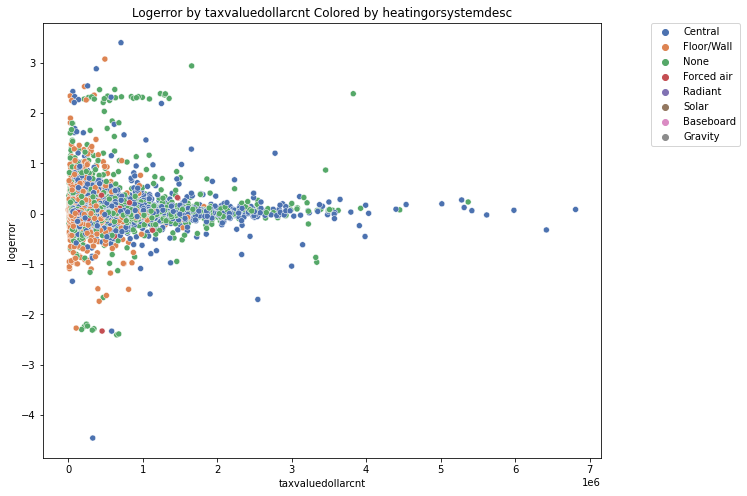

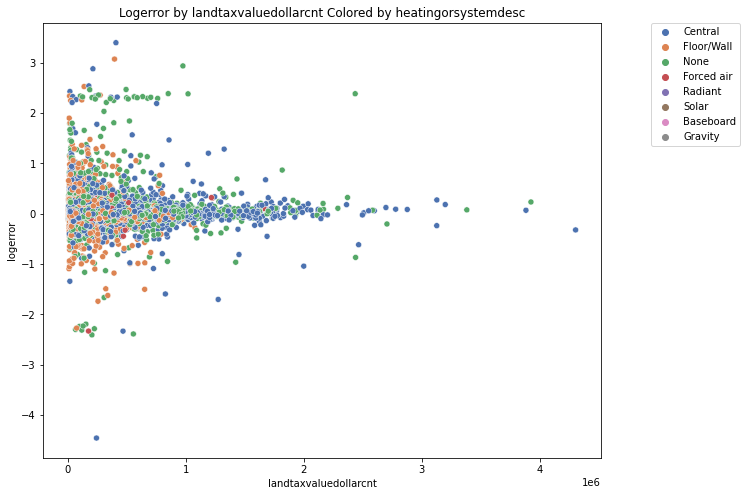

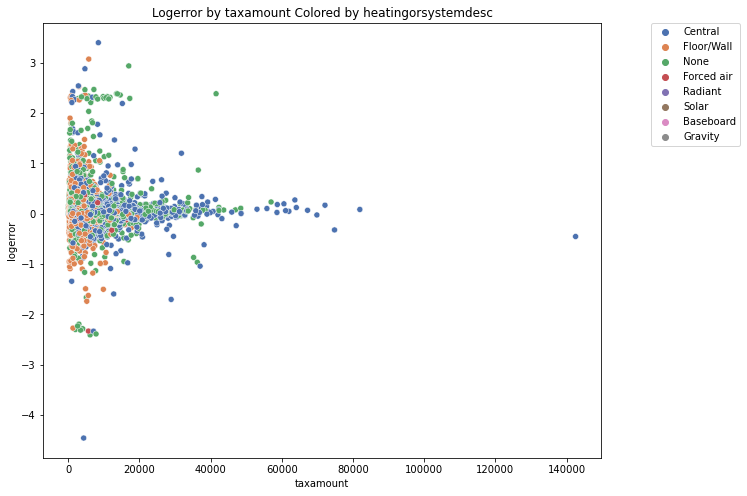

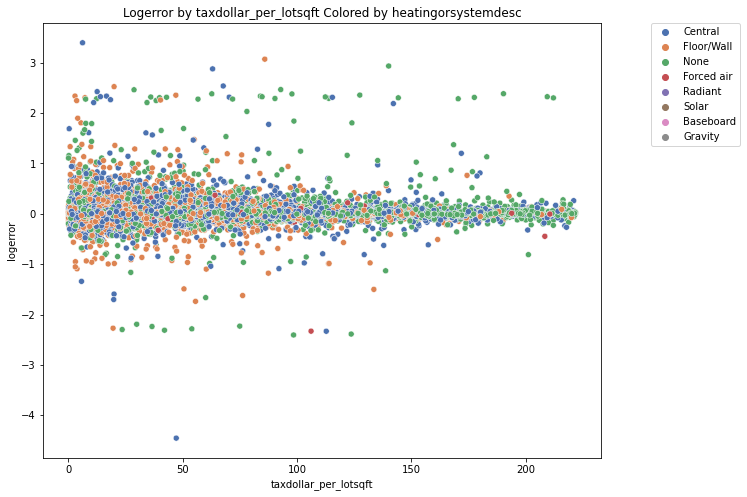

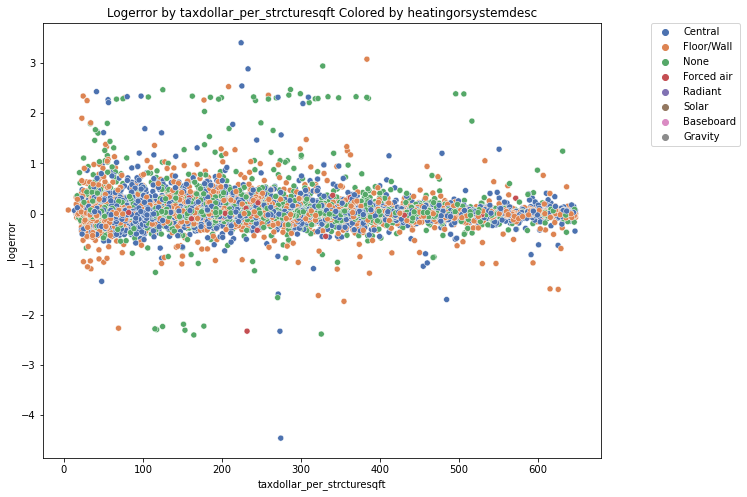

In [10]:
for col in columns:
    plt.figure(figsize=(10,8))
    sns.scatterplot(data=train, x=col, y='logerror', hue='heatingorsystemdesc', palette='deep')
    plt.title(f"Logerror by {col} Colored by heatingorsystemdesc")
    plt.legend(bbox_to_anchor=(1.25, 1),borderaxespad=0)

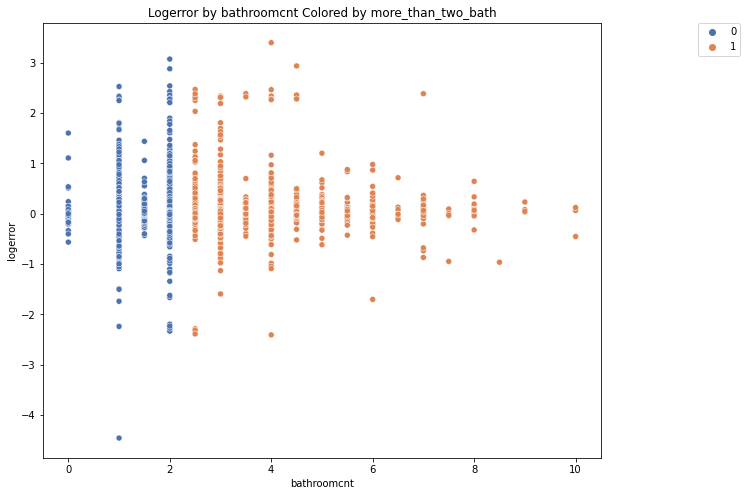

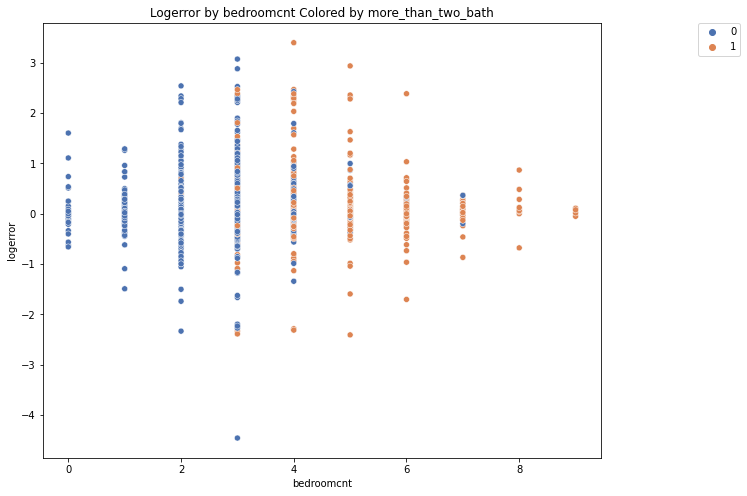

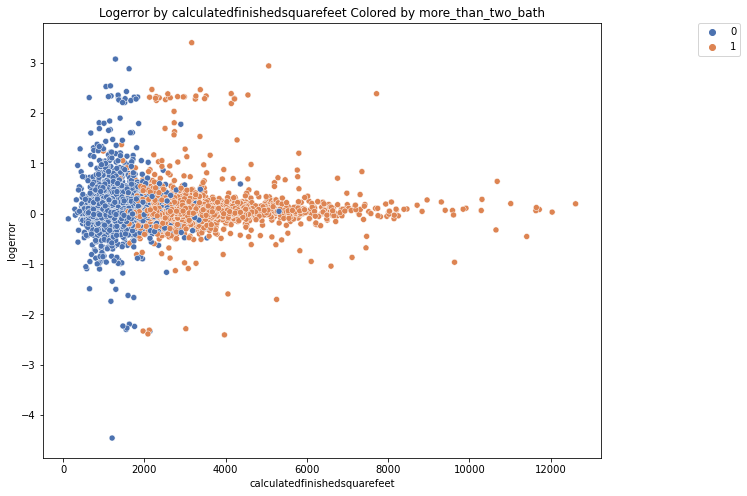

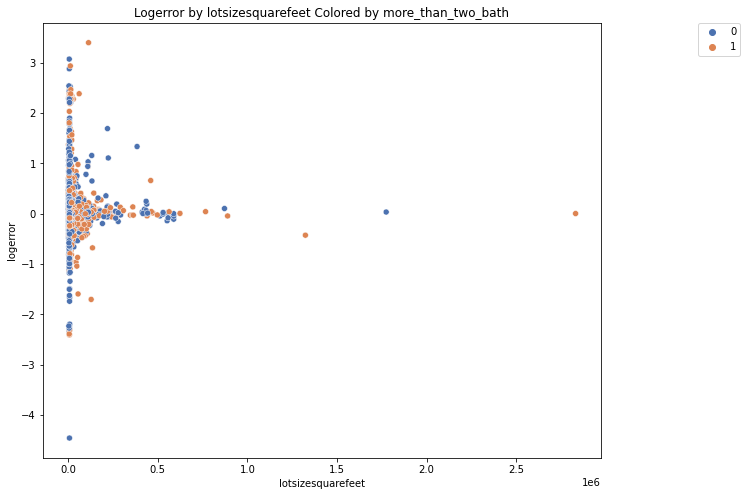

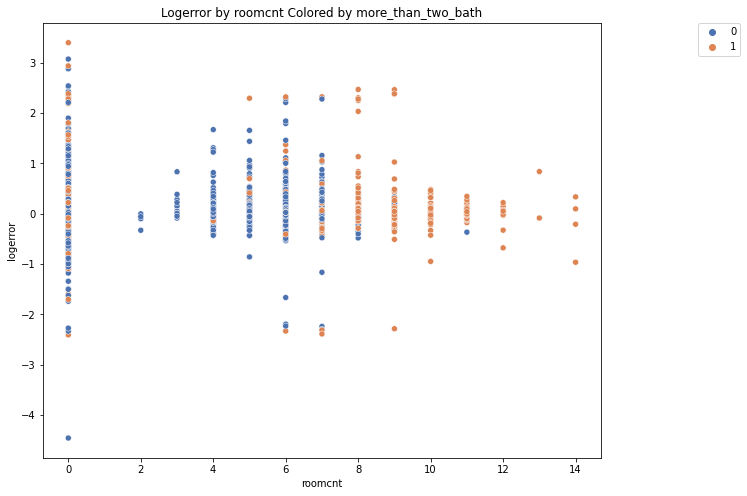

...

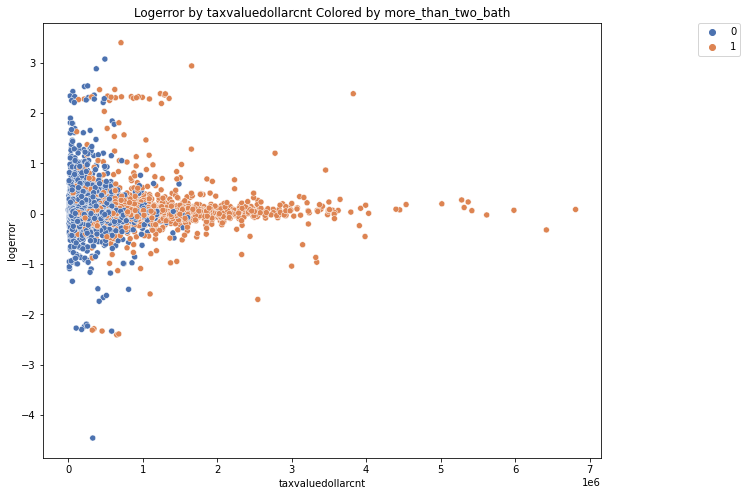

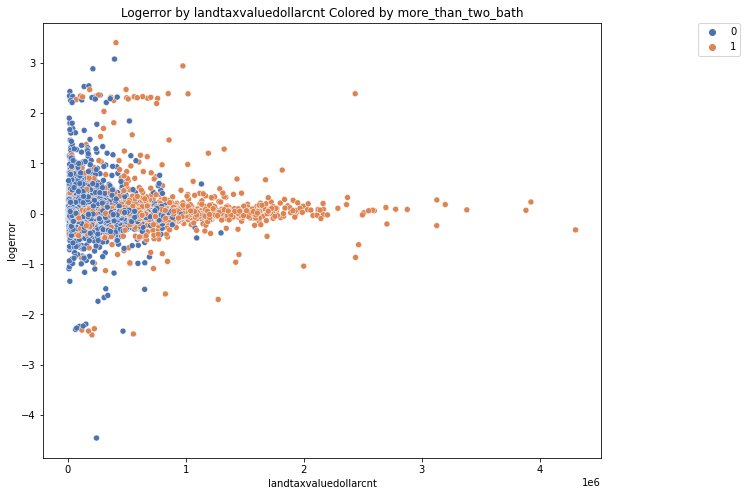

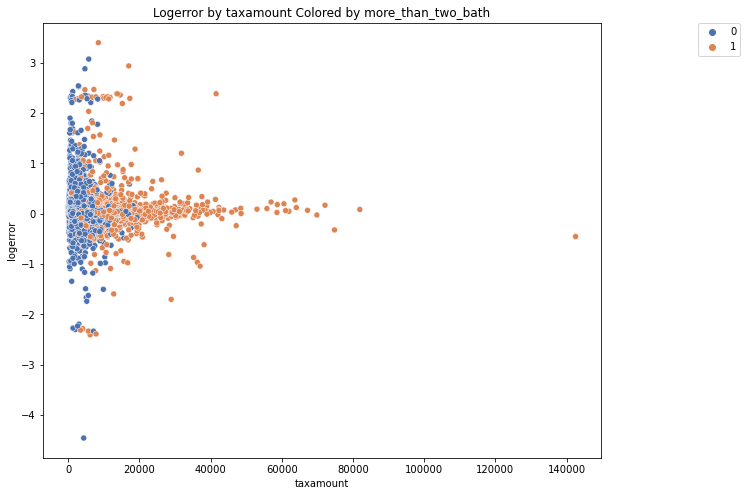

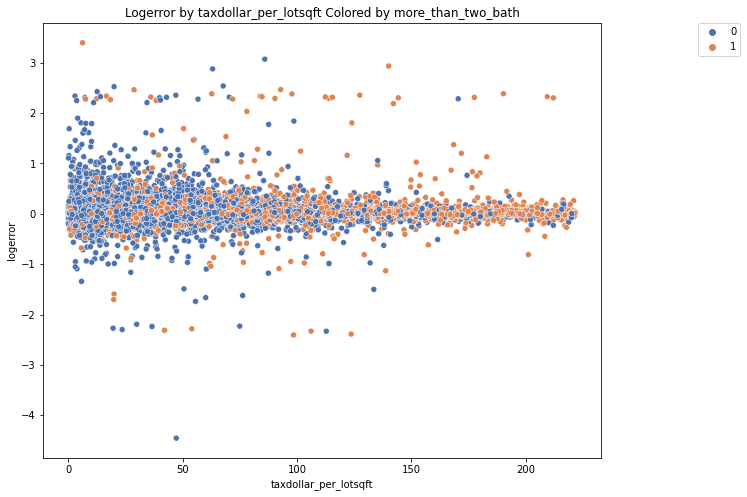

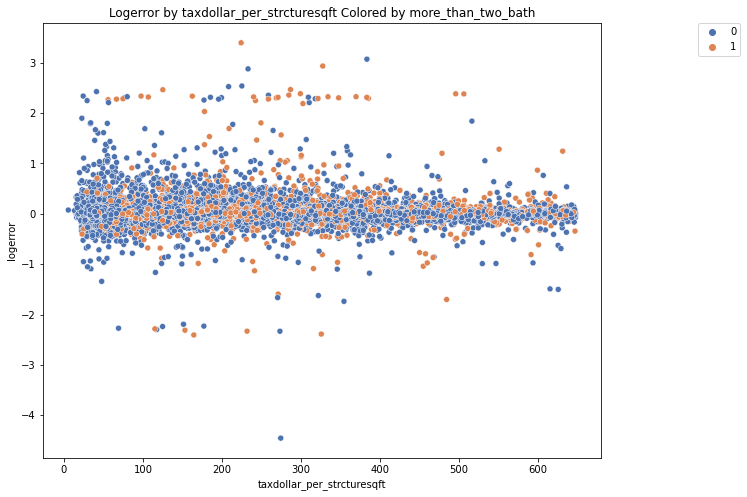

In [11]:
for col in columns:
    plt.figure(figsize=(10,8))
    sns.scatterplot(data=train, x=col, y='logerror', hue='more_than_two_bath', palette='deep')
    plt.title(f"Logerror by {col} Colored by more_than_two_bath")
    plt.legend(bbox_to_anchor=(1.25, 1),borderaxespad=0)

### Insightful Visualizations

**Logerror by Calculated Finished Sqft with coloring by Building Quality ID**

From this visual, it appears that building quality id and structure size are a candidate for clustering. Additionally, structure size betweem 3000-4000sqft may be candidates as additional features as the logerror appears to have the biggest spread between these two values.

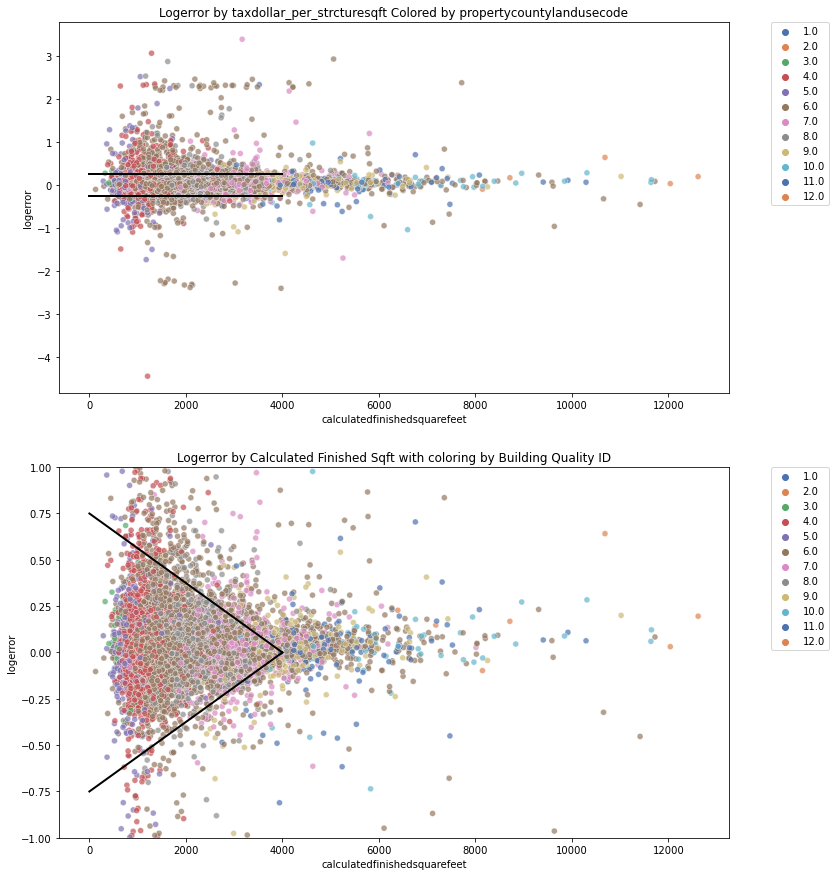

In [12]:
plt.figure(figsize=(12,15))
plt.subplot(211)
sns.scatterplot(data=train, x='calculatedfinishedsquarefeet', y='logerror', hue='buildingqualitytypeid', palette='deep', alpha=.7)
plt.plot([0, 4000], [.25, .25], 'k-', lw=2)
plt.plot([0, 4000], [-.25, -.25], 'k-', lw=2)
plt.title(f"Logerror by {col} Colored by propertycountylandusecode")
plt.legend(bbox_to_anchor=(1.15, 1),borderaxespad=0)


# Zoomed in
plt.subplot(212)
sns.scatterplot(data=train, x='calculatedfinishedsquarefeet', y='logerror', hue='buildingqualitytypeid', palette='deep', alpha=.7)
plt.ylim((-1, 1))
plt.plot([0, 4000], [.75, 0], 'k-', lw=2)
plt.plot([0, 4000], [-.75, 0], 'k-', lw=2)
plt.title(f"Logerror by Calculated Finished Sqft with coloring by Building Quality ID")
plt.legend(bbox_to_anchor=(1.15, 1),borderaxespad=0)

**Logerror by Calculated Finished SQFT Colored by More Than Two Bath**

Due to the high concentration of homes with 2 or less baths being below 2000sqft it may be useful to **NOT** to use more than two baths in our model as they appear to be highly correlated.


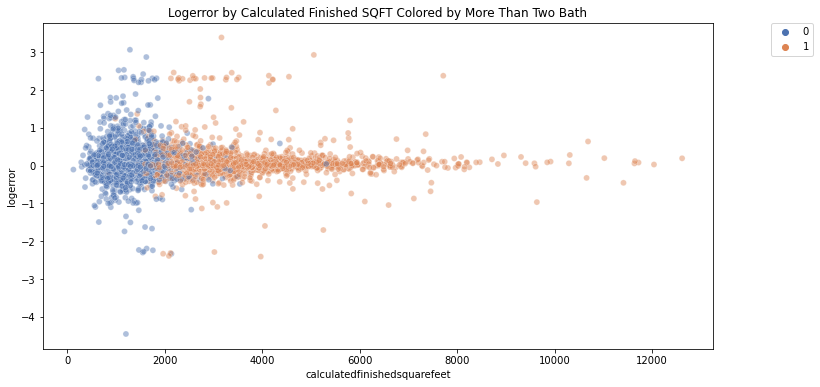

In [13]:
# Logerror by Calculated Finished SQFT Colored by More Than Two Bath
plt.figure(figsize=(12,6))
sns.scatterplot(data=train, x='calculatedfinishedsquarefeet', y='logerror', hue='more_than_two_bath', palette='deep', alpha=.45)
plt.title(f"Logerror by Calculated Finished SQFT Colored by More Than Two Bath")
plt.legend(bbox_to_anchor=(1.15, 1),borderaxespad=0)

**Logerror by Building Quality and Colored by Heating and More than 2 Baths**

I found it intersting that building quality appears to be inversely correlated with modern features were there is a higher concentration of central air above 6 quality and a higher concentation of Floor/Wall system below 6 quality. The same appers to apply for more than two bathrooms, were as the quality gets wores, the concentration of more bathrooms gets bigger.

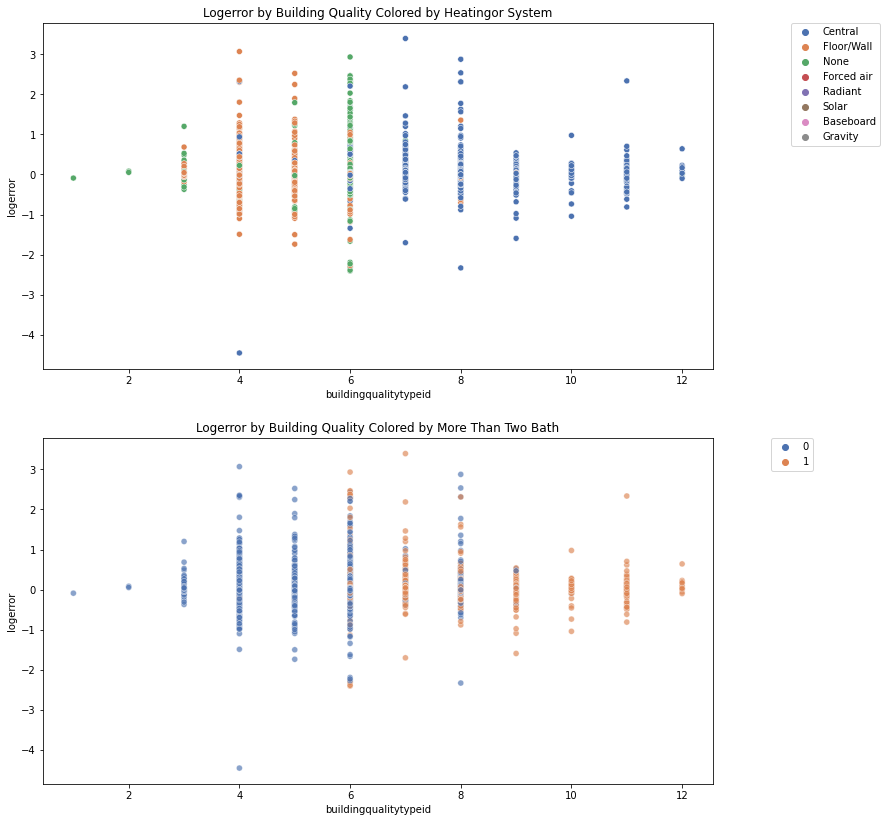

In [14]:
plt.figure(figsize=(12,14))
plt.subplot(211)
sns.scatterplot(data=train, x='buildingqualitytypeid', y='logerror', hue='heatingorsystemdesc', palette='deep')
plt.title(f"Logerror by Building Quality Colored by Heatingor System")
plt.legend(bbox_to_anchor=(1.25, 1),borderaxespad=0)

# Logerror by Building Quality Colored by More Than Two Bath
plt.subplot(212)
sns.scatterplot(data=train, x='buildingqualitytypeid', y='logerror', hue='more_than_two_bath', palette='deep', alpha=.65)
plt.title(f"Logerror by Building Quality Colored by More Than Two Bath")
plt.legend(bbox_to_anchor=(1.15, 1),borderaxespad=0)


***Logerror by Building Quality and Colored by fips and region county***

The majority of our data is from fips code 6037 and region id 3101 with very little to none of the other codes have building quality above or below 6. It is possible that we over engenieered building quality when we replaced all missing values with 6 and we may need to rethink our approach to handeling these missing values. 

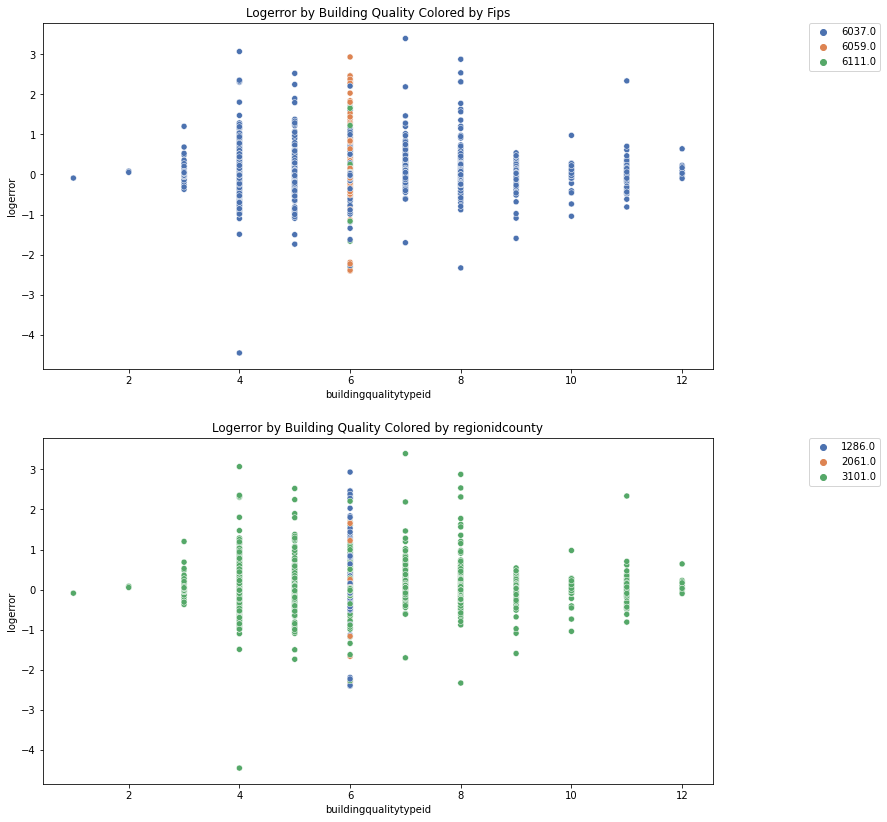

In [15]:
plt.figure(figsize=(12,14))
plt.subplot(211)
sns.scatterplot(data=train, x='buildingqualitytypeid', y='logerror', hue='fips', palette='deep')
plt.title(f"Logerror by Building Quality Colored by Fips")
plt.legend(bbox_to_anchor=(1.25, 1),borderaxespad=0)

plt.subplot(212)
sns.scatterplot(data=train, x='buildingqualitytypeid', y='logerror', hue='regionidcounty', palette='deep')
plt.title(f"Logerror by Building Quality Colored by regionidcounty")
plt.legend(bbox_to_anchor=(1.25, 1),borderaxespad=0)

## Clustering


Culstering is a useful way to create new features from our data. From the above visualizations and using industry knowledge we will use ***KMeans*** to create multiple clusters from the following features:
>'bathroomcnt', 'bedroomcnt', 'buildingqualitytypeid', 'calculatedfinishedsquarefeet', 'yearbuilt', 'heatingorsystemdesc' (floor/wall and central dummies) , 'fips', 'more_than_two_bath', 'taxvaluedollarcnt', 'regionidzip', 'fips'

Before we start creating clusters we need to scale our train, validate, test data sets. We will use ***RobustScaler*** due to outliers remaining in the data. We will also need to get dummy varaibles for features that aren't numbers. I create dummy variables at this step because I prefer seeing description features all together when they are in the same column like heatingorsystemdesc to see if creating dummies may even be useful.

We created 6 cluster feature sets from this data. They are 
* Cluster1 from 'buildingqualitytypeid', 'yearbuilt', 'Central', 'Floor/Wall', 'fips', 'more_than_two_bath', and 'taxdollar_per_strcturesqft' using 4 clusters


* Cluster2 from from 'buildingqualitytypeid', 'yearbuilt', 'Central', 'Floor/Wall', 'fips', 'more_than_two_bath', and 'taxdollar_per_strcturesqft'using 5 clusters


* Cluster3 from 'buildingqualitytypeid', 'yearbuilt', 'Central', 'Floor/Wall', 'fips', 'more_than_two_bath', 'taxdollar_per_strcturesqft' using 4 cluster


* Cluster4 from 'buildingqualitytypeid', 'calculatedfinishedsquarefeet', 'more_than_two_bath'


* Cluster5 from 'calculatedfinishedsquarefeet', 'more_than_two_bath', 'taxvaluedollarcnt' using 4 clusters


* Cluster6 from 'calculatedfinishedsquarefeet', 'lotsizesquarefeet', 'taxvaluedollarcnt', 'regionidcity' using 3 clusters

After our clusters are created we can potentially create [useful visuals](#Useful-Cluster-Visual) and continue on to feature selection

**Jump to** [Table of Content](#Table-of-Contents), [Wrangle](#Wrangle), [Visualizations](#Visualization), [Clustering](#Clustering), [Hypthosis Testing](#Hypthosis-Testing), [Choosen Features](#Choosen-Features), [Modeling](#Modeling), [Results and Summary](#Results-&-Conclusion), [Next Steps](#Next-Steps)

In [16]:
#Careate central feature
train['Central'] = (train['heatingorsystemdesc'] == 'Central').astype(int)
validate['Central'] =  (validate['heatingorsystemdesc'] == 'Central').astype(int)
test['Central'] = (test['heatingorsystemdesc'] == 'Central').astype(int)

# Create Floor/Wall feature
train['Floor/Wall'] = (train['heatingorsystemdesc'] == 'Floor/Wall').astype(int)
validate['Floor/Wall'] =  (validate['heatingorsystemdesc'] == 'Floor/Wall').astype(int)
test['Floor/Wall'] = (test['heatingorsystemdesc'] == 'Floor/Wall').astype(int)

# Drop heatingorsystemdesc
train.drop(columns=['heatingorsystemdesc'], inplace=True)
validate.drop(columns=['heatingorsystemdesc'], inplace=True)
test.drop(columns=['heatingorsystemdesc'], inplace=True)

In [17]:
# Create copies of the dataframe to scale
train_scaled = train.copy()
validate_scaled = validate.copy()
test_scaled = test.copy()

# Fit the scalre to the training data
train_scaler = sklearn.preprocessing.RobustScaler()
train_scaler.fit(train_scaled)
validate_scaler = sklearn.preprocessing.RobustScaler()
validate_scaler.fit(validate_scaled)
test_scaler = sklearn.preprocessing.RobustScaler()
test_scaler.fit(test_scaled)


# Then transform all the remaining data sets
train_scaled = pd.DataFrame(train_scaler.transform(train_scaled), columns=train.columns)
validate_scaled = pd.DataFrame(validate_scaler.transform(validate_scaled), columns=validate.columns)
test_scaled = pd.DataFrame(test_scaler.transform(test_scaled), columns=test.columns)

In [18]:
print(f"Shapes of my scaled data sets are: \n train - {train_scaled.shape}\n validate - {validate_scaled.shape} \n test - {test_scaled.shape}")

Shapes of my scaled data sets are: 
 train - (28542, 29)
 validate - (9520, 29) 
 test - (9517, 29)


Cluster1 from 'buildingqualitytypeid', 'yearbuilt', 'Central', 'Floor/Wall', 'fips', 'more_than_two_bath', 'taxdollar_per_strcturesqft' using 4 clusters

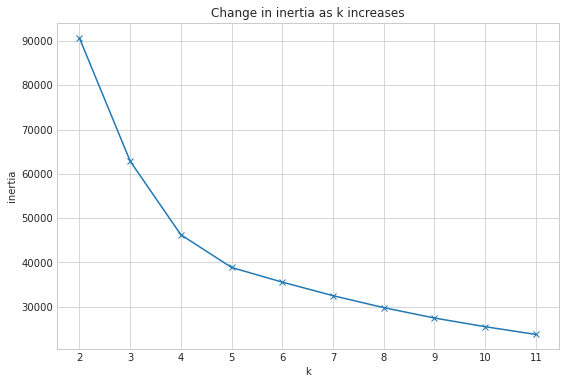

In [19]:
# Use elbow method to ensure that we picked a good number of clusters

# Create a data frame with just the features we want to look at
X = train_scaled[['buildingqualitytypeid', 'yearbuilt', 'Central', 'Floor/Wall', 'fips', 'more_than_two_bath', 'taxdollar_per_strcturesqft']]

# Plot the inertia
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

An argument can be made to use either 4 or 5 clusters so we'll create cluster 1 on 4 

In [20]:
# Cluster 1
kmeans = KMeans(n_clusters=4)
# Fit the model 
kmeans.fit(X)
#Store the predicted results in the original data farme as a new feature cluster
train_scaled['cluster1'] = kmeans.predict(X)

In [21]:
# Cluster 2
kmeans = KMeans(n_clusters=5)
# Fit the model 
kmeans.fit(X)
#Store the predicted results in the original data farme as a new feature cluster
train_scaled['cluster2'] = kmeans.predict(X)

Cluster3 from 'buildingqualitytypeid', 'yearbuilt', 'Central', 'Floor/Wall', 'fips', 'more_than_two_bath', 'taxdollar_per_strcturesqft'

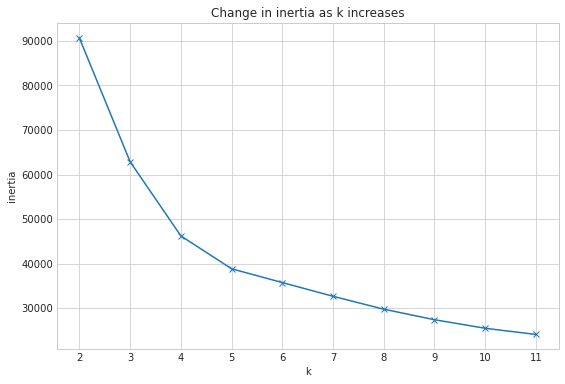

In [22]:
X = train_scaled[['buildingqualitytypeid', 'yearbuilt', 'Central', 'Floor/Wall', 'fips', 'more_than_two_bath', 'taxdollar_per_strcturesqft']]
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

In [23]:
# Cluster 3
kmeans = KMeans(n_clusters=4)
# Fit the model 
kmeans.fit(X)
#Store the predicted results in the original data farme as a new feature cluster
train_scaled['cluster3'] = kmeans.predict(X)

Cluster4 from 'buildingqualitytypeid', 'calculatedfinishedsquarefeet', 'more_than_two_bath'

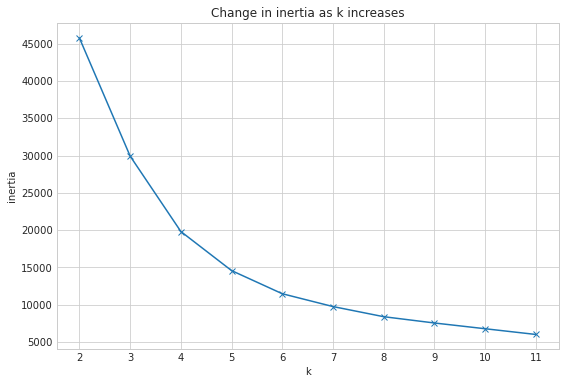

In [24]:
X = train_scaled[['buildingqualitytypeid', 'calculatedfinishedsquarefeet', 'more_than_two_bath']]
# Plot the inertia
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

In [25]:
# Looks like 4 is the best bet
kmeans = KMeans(n_clusters=4)
# Fit the model 
kmeans.fit(X)
#Store the predicted results in the original data farme as a new feature cluster
train_scaled['cluster4'] = kmeans.predict(X)

Cluster5 from 'calculatedfinishedsquarefeet', 'more_than_two_bath', 'taxvaluedollarcnt'

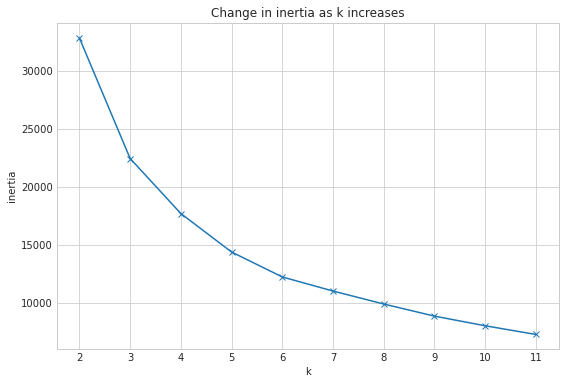

In [26]:
X = train_scaled[['calculatedfinishedsquarefeet', 'more_than_two_bath', 'taxvaluedollarcnt']]
# Plot the inertia to determine K
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

In [27]:
# An argument can be made to use either 4 we will use 4
kmeans = KMeans(n_clusters=4)
# Fit the model 
kmeans.fit(X)
#Store the predicted results in the original data farme as a new feature cluster
train_scaled['cluster5'] = kmeans.predict(X)

Cluster6 from 'calculatedfinishedsquarefeet', 'lotsizesquarefeet', 'taxvaluedollarcnt', 'regionidcity'

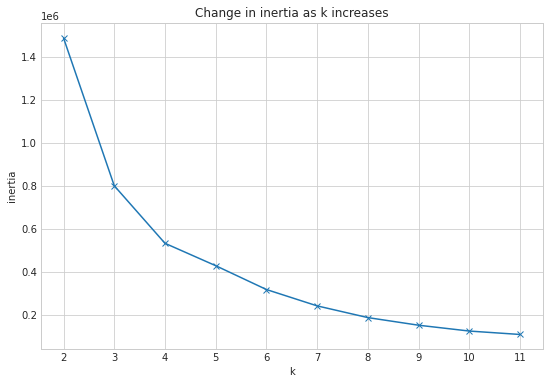

In [28]:
X = train_scaled[['calculatedfinishedsquarefeet', 'lotsizesquarefeet', 'taxvaluedollarcnt', 'regionidcity']]
# Plot the inertia to determine K
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

In [29]:
# An argument can be made to use 3 or 4 we will use 3
kmeans = KMeans(n_clusters=3)
# Fit the model 
kmeans.fit(X)
#Store the predicted results in the original data farme as a new feature cluster
train_scaled['cluster6'] = kmeans.predict(X)

### Useful Cluster Visual

Cluster4 was created from 'buildingqualitytypeid', 'calculatedfinishedsquarefeet', 'more_than_two_bath' using 4 clusters. It apppears that cluster 2 and cluster 3 are tightly associated with logerror v taxdollarcnt while cluster 0 and 1 are not

Text(0.5, 1.0, 'Logerror by Calculated SQFT highlighted by Cluster 4')

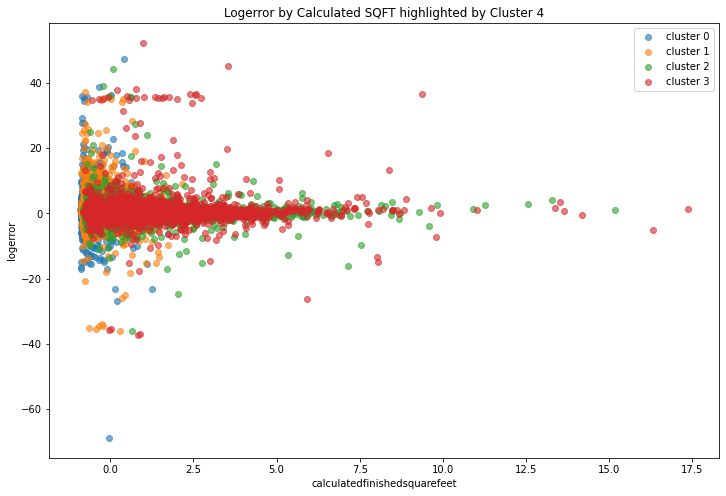

In [30]:
plt.figure(figsize=(12, 8))

for cluster, subset in train_scaled.groupby('cluster4'):
    plt.scatter(subset.taxvaluedollarcnt, subset.logerror, label='cluster ' + str(cluster), alpha=.6)

plt.legend()
plt.xlabel('calculatedfinishedsquarefeet')
plt.ylabel('logerror')
plt.title('Logerror by Calculated SQFT highlighted by Cluster 4')

Cluster2 was created from 'buildingqualitytypeid', 'yearbuilt', 'Central', 'Floor/Wall', 'fips', 'more_than_two_bath', and 'taxdollar_per_strcturesqft' using 5 clusters. Cluster 2, 3, and 4 appear to have less logerror

Text(0.5, 1.0, 'Logerror by Calculated SQFT highlighted by Cluster 2')

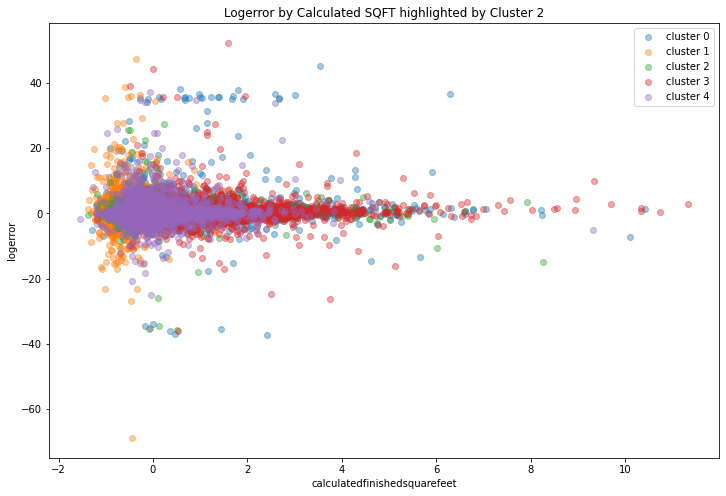

In [31]:
plt.figure(figsize=(12, 8))

for cluster, subset in train_scaled.groupby('cluster2'):
    plt.scatter(subset.calculatedfinishedsquarefeet, subset.logerror, label='cluster ' + str(cluster), alpha=.4)

plt.legend()
plt.xlabel('calculatedfinishedsquarefeet')
plt.ylabel('logerror')
plt.title('Logerror by Calculated SQFT highlighted by Cluster 2')

## Hypothesis Testing

From the above visualizations and culster creation we can conduct various statstical test to discover which features are correlated with our target. We can also use From our hypothsis testing we can begin to model with the [Choosen Features](#Choosen-Features)

**Jump to** [Table of Content](#Table-of-Contents), [Wrangle](#Wrangle), [Visualizations](#Visualization), [Clustering](#Clustering), [Hypothesis Testing](#Hypothesis-Testing), [Choosen Features](#Choosen-Features), [Modeling](#Modeling), [Results and Summary](#Results-&-Conclusion), [Next Steps](#Next-Steps)

### One Sample Two Tail

- $H0$ The mean logerror of calculatedfinishedsquarefeet that are equal or above 3000sqf is the same as the average logerror
- $Ha$ The mean log error of calculatedfinishedsquarefeet that are equal or above 3000sqf is not the same as the average logeerror

In [32]:
above3k = train.loc[train['calculatedfinishedsquarefeet'] > 3000]

t, p = stats.ttest_1samp(above3k.logerror, train.logerror.mean())

print(f't = {t:.3f}')
print(f'p = {p:.3f}')

if p < .05:
    print('Reject H0')
else:
    print("Fail to reject H0")

t = 4.165
p = 0.000
Reject H0


### Two Sample Two Tail

- $H0$ The mean logerror of buildingqualitytypeid that are 6+ is the same as the average logerror for less than 6
- $Ha$ The mean log error of buildingqualitytypeid that are 6+ is not the same as the average logeerror less than 6


In [33]:
# Create the test samples
six_or_higher = train.loc[train['buildingqualitytypeid'] >= 6]
less_than_six = train.loc[train['buildingqualitytypeid'] < 6]

# Use ttest_ind to conduct the T-Test
t, p = stats.ttest_ind(six_or_higher.logerror, less_than_six.logerror, equal_var = False)
a = .05
print(f"T = {t}, p/2= {p/2}")
print("is p/2 < a? ", p/2 < a)
print("is t > 0? ", t > 0)
if p > a:
    print("We fail to reject H0")
elif t > 0:
    print("We fail to reject H0")
else:
    print("We reject H0")

T = -0.5884685177299681, p/2= 0.27811776076364414
is p/2 < a?  False
is t > 0?  False
We fail to reject H0


- $H0$ The mean logerror of calculatedfinishedsquarefeet that are below 3ksqft is the same as the average logerror of calculatedfinishedsquarefeet that are equal or above 3ksqft
- $Ha$ The mean log error of calculatedfinishedsquarefeet that are below 3ksqft is not the same as the logerror of calculatedfinishedsquarefeet that are equal or above 3ksqft

In [34]:
# Create the test samples
below3k = train.loc[train['calculatedfinishedsquarefeet'] < 3000]
rest = train.loc[train['calculatedfinishedsquarefeet'] >= 3000]

# Use ttest_ind to conduct the T-Test
t, p = stats.ttest_ind(below3k.logerror, rest.logerror, equal_var = False)
a = .05
print(f"T = {t}, p/2= {p}")
print("is p/2 < a? ", p < a)
print("is t > 0? ", t > 0)
if p > a:
    print("We fail to reject $H_{0}$")
elif t > 0:
    print("We fail to reject $H_{0}$")
else:
    print("We reject H0")

T = -4.4890268134658955, p/2= 7.4132293212332e-06
is p/2 < a?  True
is t > 0?  False
We reject H0


- $H0$ The mean logerror of homes with more than two baths is the same as the average logerror for homes with 2 or less baths
- $Ha$ The mean logerror of homes with more than two baths is not the same as the average logerror for homes with 2 or less baths

In [35]:
# Set up for the two sample test
two_or_less_bath = train[train.more_than_two_bath == False]
greater_than_two_bath = train[train.more_than_two_bath == True]

t, p = stats.ttest_ind(two_or_less_bath.logerror, greater_than_two_bath.logerror)


print(f"T = {t}, p/2= {p/2}")
print("is p/2 < a? ", p/2 < a)
print("is t < 0? ", t > 0)
if p > a:
    print("We fail to reject H0")
elif t > 0:
    print("We fail to reject H0")
else:
    print("We reject H0")

T = -4.111485848322021, p/2= 1.971101120035391e-05
is p/2 < a?  True
is t < 0?  False
We reject H0


### Pearson's R
- $H0$ There is not a linear realtionship between lotsize and logerror
- $Ha$ There is a linear realtionship between lotsize and logerror


In [36]:
corr, p = stats.pearsonr(train['lotsizesquarefeet'], train['logerror'])

print(corr, p)
if p < .05:
    print('Reject H0')
else:
    print("Fail to reject H0")

0.01094093204455317 0.06454785911430241
Fail to reject H0


- $H0$ There is not a linear realtionship between taxvaluedollarcnt and logerror
- $Ha$ There is a linear realtionship between taxvaluedollarcnt and logerror

In [37]:
corr, p = stats.pearsonr(train['taxvaluedollarcnt'], train['logerror'])

print(corr, p)
if p < .05:
    print('Reject H0')
else:
    print("Fail to reject H0")

0.00719411584187368 0.22422744346786075
Fail to reject H0


- $H0$ There is not a linear realtionship between calculatedfinishedsquarefeet and logerror
- $Ha$ There is a linear realtionship between calculatedfinishedsquarefeet and logerror


In [38]:
corr, p = stats.pearsonr(train['calculatedfinishedsquarefeet'], train['logerror'])

print(corr, p)
if p < .05:
    print('Reject H0')
else:
    print("Fail to reject H0")

0.035484482506201814 2.016053193707874e-09
Reject H0


### Chi Squared

- $H0$ There is not a realtionship between the culsters and logerror
- $Ha$ There is a realtionship between the clusters and logerror

In [39]:
observed = pd.crosstab(train_scaled['cluster1'], train_scaled['logerror'])
chi2, p, degf, expected = stats.chi2_contingency(observed)
print(chi2, p)
if p < .05:
    print('Reject H0')
else:
    print("Fail to reject H0")

85452.81129404757 0.39835181756220106
Fail to reject H0


- $H0$ There is not a realtionship between the culster2 and logerror
- $Ha$ There is a realtionship between the cluster2 and logerror

In [40]:
observed = pd.crosstab(train_scaled['cluster2'], train_scaled['logerror'])
chi2, p, degf, expected = stats.chi2_contingency(observed)
print(chi2, p)
if p < .05:
    print('Reject H0')
else:
    print("Fail to reject H0")

113943.65576796861 0.37798715195762844
Fail to reject H0


- $H0$ There is not a realtionship between the culster3 and logerror
- $Ha$ There is a realtionship between the cluster3 and logerror

In [41]:
observed = pd.crosstab(train_scaled['cluster3'], train_scaled['logerror'])
chi2, p, degf, expected = stats.chi2_contingency(observed)
print(chi2, p)
if p < .05:
    print('Reject H0')
else:
    print("Fail to reject H0")

85452.81129404755 0.39835181756221455
Fail to reject H0


- $H0$ There is not a realtionship between the culster4 and logerror
- $Ha$ There is a realtionship between the cluster4 and logerror

In [42]:
observed = pd.crosstab(train_scaled['cluster4'], train_scaled['logerror'])
chi2, p, degf, expected = stats.chi2_contingency(observed)
print(chi2, p)
if p < .05:
    print('Reject H0')
else:
    print("Fail to reject H0")

85371.85654577008 0.4753725847812904
Fail to reject H0


- $H0$ There is not a realtionship between the culster5 and logerror
- $Ha$ There is a realtionship between the cluster5 and logerror

In [43]:
observed = pd.crosstab(train_scaled['cluster5'], train_scaled['logerror'])
chi2, p, degf, expected = stats.chi2_contingency(observed)
print(chi2, p)
if p < .05:
    print('Reject H0')
else:
    print("Fail to reject H0")

85498.81412467032 0.35611984553387577
Fail to reject H0


- $H0$ There is not a realtionship between the culster6 and logerror
- $Ha$ There is a realtionship between the cluster6 and logerror

In [44]:
observed = pd.crosstab(train_scaled['cluster6'], train_scaled['logerror'])
chi2, p, degf, expected = stats.chi2_contingency(observed)
print(chi2, p)
if p < .05:
    print('Reject H0')
else:
    print("Fail to reject H0")

57083.99999999999 0.2902159122364112
Fail to reject H0


## Choosen Features

We found that the following alternative hyptohsis desevered more scrutiny/testing:

- $Ha$ The mean log error of calculatedfinishedsquarefeet that are equal or above 3000sqf is not the same as the average logeerror
- $Ha$ The mean log error of calculatedfinishedsquarefeet that are below 3ksqft is not the same as the logerror of calculatedfinishedsquarefeet that are equal or above 3ksqft
- $Ha$ The mean logerror of homes with more than two baths is not the same as the average logerror for homes with 2 or less baths
- $Ha$ There is a linear realtionship between taxvaluedollarcnt and logerror
- $Ha$ There is a linear realtionship between calculatedfinishedsquarefeet and logerror

Sadly, none of the cluster I created were shown to have a statisical realtionship with logerror as created.

From our hypothsis testing we can use the following features: 
>'above_or_equal_3ksqft', 'below_3ksqft', 'calculatedfinishedsquarefeet', 'taxvaluedollarcnt', and 'more_than_two_bath', 'taxdollar_per_strcturesqft'

**Jump to** [Table of Content](#Table-of-Contents), [Wrangle](#Wrangle), [Visualizations](#Visualization), [Clustering](#Clustering), [Hypothesis Testing](#Hypothesis-Testing), [Choosen Features](#Choosen-Features), [Modeling](#Modeling), [Results and Summary](#Results-&-Conclusion), [Next Steps](#Next-Steps)

## Modeling
Now that we know what features we will use in our model we can begin trying to improve upon logerror scores. We will create 4 models with the baseline model being the 

* Baseline model is the mean of the logerror or logerror
* Model1 uses Linear Regression on All Features minus the clusters
* Model2 uses Linear Regression on 'calculatedfinishedsquarefeet', 'taxvaluedollarcnt', and 'more_than_two_bath'
* Model3 uses Linear Regression on 'calculatedfinishedsquarefeet', 'taxvaluedollarcnt'
* Model4 Linear Regression Model on 'taxdollar_per_strcturesqft', 'more_than_two_bath'
Before we do that I will create a copy of the scaled DFs in order to preseve them for future work where the columns are equal to the features used in the model. I will also create a y_train, y_validate, and y_test DFs for modelings. 

Once the models are created, we will [conclude](#Results-&-Conclusion) by evaluating our model on the test 

**Jump to** [Table of Content](#Table-of-Contents), [Wrangle](#Wrangle), [Visualizations](#Visualization), [Clustering](#Clustering), [Hypothesis Testing](#Hypothesis-Testing), [Choosen Features](#Choosen-Features), [Modeling](#Modeling), [Results and Summary](#Results-&-Conclusion), [Next Steps](#Next-Steps)

In [45]:
# Splits the target from the data sets for modeling 
# Create the Model 1 DFs
X_train = train_scaled.drop(columns=['logerror', 'cluster1', 'cluster2', 'cluster3', 'cluster4',
       'cluster5', 'cluster6'])
X_validate = validate_scaled.drop(columns=['logerror'])
X_test = test_scaled.drop(columns=['logerror'])

y_train = train_scaled[['logerror']]
y_validate = validate_scaled[['logerror']]
y_test = test_scaled[['logerror']]

#Print to make sure it took
X_train

,bathroomcnt,bedroomcnt,buildingqualitytypeid,calculatedfinishedsquarefeet,fips,hashottuborspa,latitude,longitude,lotsizesquarefeet,rawcensustractandblock,...,landtaxvaluedollarcnt,taxamount,censustractandblock,has_pool,has_basement,taxdollar_per_lotsqft,taxdollar_per_strcturesqft,more_than_two_bath,Central,Floor/Wall
0,1.0,1.0,2.0,0.263158,0.0,0.0,-0.111911,0.629098,-0.690751,-0.009182,...,0.503689,0.663167,-0.009186,0.0,0.0,1.279822,0.457559,1.0,1.0,0.0
1,-1.0,0.0,-2.0,-0.877193,0.0,0.0,-0.311584,-0.093954,-0.864162,-0.002860,...,-0.247127,-0.037643,-0.002865,0.0,0.0,0.439334,0.912869,0.0,0.0,1.0
2,0.5,0.0,0.0,0.038184,1.0,0.0,-0.359948,0.680863,-0.083494,0.989778,...,-0.214788,-0.107915,0.989774,0.0,0.0,0.014562,-0.093393,1.0,0.0,0.0
3,0.0,0.0,0.0,-0.357069,0.0,0.0,0.574227,-0.717251,0.254656,-0.022397,...,0.156813,0.165672,-0.022402,0.0,0.0,0.089856,0.535361,0.0,1.0,0.0
4,0.0,1.0,0.0,0.511868,1.0,0.0,-0.526630,0.716391,0.282595,0.989782,...,1.018259,0.613216,0.989778,1.0,0.0,0.598446,0.440281,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28537,-1.0,0.0,-2.0,-0.369453,0.0,0.0,-0.095107,-0.285990,-0.073218,-0.017092,...,-0.582265,-0.908414,-0.017097,0.0,0.0,-0.764484,-0.953712,0.0,0.0,0.0
28538,3.0,1.0,4.0,3.993808,0.0,0.0,0.291837,-0.842281,4.032755,-0.021358,...,2.249889,5.225224,-0.021362,1.0,0.0,1.096204,0.897789,1.0,1.0,0.0
28539,0.0,0.0,0.0,-0.390093,0.0,0.0,0.623417,-0.697983,0.330443,-0.022749,...,0.581219,0.297202,-0.022753,0.0,0.0,0.176515,0.785073,0.0,0.0,1.0
28540,0.0,0.0,0.0,-0.340557,0.0,0.0,-0.330559,0.294054,-0.145472,-0.004528,...,0.635073,0.475856,-0.004533,0.0,0.0,0.509478,0.853674,0.0,1.0,0.0


### Baseline

In [46]:
# setting baseline to average log_error
baseline = train_scaled.logerror.mean()

# calculating MSE with y_train (actual) and baseline (extended to same size as df)
baseline_mse = mean_squared_error(y_train.logerror, np.full(y_train.shape, baseline))
baseline_rmse = baseline_mse**(1/2)

print('The Baseline Mean Squared Error:', round(baseline_mse,6))
print('The Baseline Root Mean Squared Error:', round(baseline_rmse,6))

The Baseline Mean Squared Error: 7.34075
The Baseline Root Mean Squared Error: 2.709382


### Model 1
Using Linear Regression Model on All Features minus the clusters

In [47]:
lm1 = LinearRegression()
lm1.fit(X_train, y_train.logerror)
y_hat = lm1.predict(X_train)

y_train['lm_1'] = y_hat

lm1_mse = mean_squared_error(y_train.logerror, y_hat)
lm1_rmse = mean_squared_error(y_train.logerror, y_hat)**(1/2)

print('LM1 Mean Squared Error:', (lm1_mse))
print('LM1 Root Mean Squared Error:', (lm1_rmse))

LM1 Mean Squared Error: 7.290010343127753
LM1 Root Mean Squared Error: 2.700001915393349


In [48]:
# Run the model on validate
y_hat = lm1.predict(X_validate)

# Create ad DF to hold validate preductions
y_Validate = pd.DataFrame(y_validate)
y_Validate['lm_1'] = y_hat

lm1_mse = mean_squared_error(y_validate.logerror, y_hat)
lm1_rmse = mean_squared_error(y_validate.logerror, y_hat)**(1/2)

print('LM1 Mean Squared Error:', (lm1_mse))
print('LM1 Root Mean Squared Error:', (lm1_rmse))

LM1 Mean Squared Error: 7.289540609349276
LM1 Root Mean Squared Error: 2.6999149263169895


### Model 2 
Using Linear Regression Model on 'calculatedfinishedsquarefeet', 'taxvaluedollarcnt', and 'more_than_two_bath'

In [49]:
model_columns = ['calculatedfinishedsquarefeet', 'taxvaluedollarcnt', 'more_than_two_bath']

X_train = train_scaled[model_columns]
X_validate = validate_scaled[model_columns]
X_test = test_scaled[model_columns]

lm2 = LinearRegression()
lm2.fit(X_train, y_train.logerror)
y_hat = lm2.predict(X_train)

y_train['lm_2'] = y_hat


lm2_mse = mean_squared_error(y_train.logerror, y_hat)
lm2_rmse = mean_squared_error(y_train.logerror, y_hat)**(1/2)

print('LM2 Mean Squared Error:', (lm2_mse))
print('LM2 Root Mean Squared Error:', (lm2_rmse))

LM2 Mean Squared Error: 7.32693567808639
LM2 Root Mean Squared Error: 2.7068312984163585


In [50]:
# Validate
y_hat = lm2.predict(X_validate)

y_Validate['lm_2'] = y_hat
mean_squared_error(y_validate.logerror, y_hat)**(1/2)

2.702705637040736

## Model 3

Using Linear Regression Model on 'calculatedfinishedsquarefeet', 'taxvaluedollarcnt'

In [51]:
model_columns = ['calculatedfinishedsquarefeet', 'taxvaluedollarcnt']

X_train = train_scaled[model_columns]
X_validate = validate_scaled[model_columns]
X_test = test_scaled[model_columns]

lm3 = LinearRegression()
lm3.fit(X_train, y_train.logerror)
y_hat = lm3.predict(X_train)

y_train['lm_3'] = y_hat


lm3_mse = mean_squared_error(y_train.logerror, y_hat)
lm3_rmse = mean_squared_error(y_train.logerror, y_hat)**(1/2)

print('LM1 Mean Squared Error:', (lm3_mse))
print('LM1 Root Mean Squared Error:', (lm3_rmse))

LM1 Mean Squared Error: 7.326941395307439
LM1 Root Mean Squared Error: 2.7068323544888107


In [52]:
# Validate
y_hat = lm3.predict(X_validate)

y_Validate['lm_3'] = y_hat
mean_squared_error(y_validate.logerror, y_hat)**(1/2)

2.7027231460390877

## Model 4

Using Linear Regression Model on 'taxdollar_per_strcturesqft', 'more_than_two_bath'

In [53]:
model_columns = ['taxdollar_per_strcturesqft', 'more_than_two_bath']

X_train = train_scaled[model_columns]
X_validate = validate_scaled[model_columns]
X_test = test_scaled[model_columns]

lm4 = LinearRegression()
lm4.fit(X_train, y_train.logerror)
y_hat = lm4.predict(X_train)

y_train['lm_4'] = y_hat


lm4_mse = mean_squared_error(y_train.logerror, y_hat)
lm4_rmse = mean_squared_error(y_train.logerror, y_hat)**(1/2)

print('LM4 Mean Squared Error:', (lm3_mse))
print('LM4 Root Mean Squared Error:', (lm3_rmse))

LM4 Mean Squared Error: 7.326941395307439
LM4 Root Mean Squared Error: 2.7068323544888107


In [54]:
# Validate
y_hat = lm4.predict(X_validate)

y_Validate['lm_4'] = y_hat
mean_squared_error(y_validate.logerror, y_hat)**(1/2)

2.7039189524302567

# Results & Conclusion

**Jump to** [Table of Content](#Table-of-Contents), [Wrangle](#Wrangle), [Visualizations](#Visualization), [Clustering](#Clustering), [Hypothesis Testing](#Hypothesis-Testing), [Choosen Features](#Choosen-Features), [Modeling](#Modeling), [Results and Summary](#Results-&-Conclusion), [Next Steps](#Next-Steps)

In [55]:
print(f"Model 1 RMSE- {lm1_rmse}\nModel 2 RMSE - {lm2_rmse}\nModel 3 RMSE - {lm3_rmse}\nModel 4 RMSE - {lm4_rmse}\nBaseline RMSE - {baseline_rmse}")

Model 1 RMSE- 2.6999149263169895
Model 2 RMSE - 2.7068312984163585
Model 3 RMSE - 2.7068323544888107
Model 4 RMSE - 2.706761265128289
Baseline RMSE - 2.70938180290154


After running our creating two models we determined that the best model was the first model we created which used Linear Regression on All Features minus the clusters. However, the goal is to find which features impact logerror and in that case, less is more, so we will actually test on the model 4. Now we need to test our model on the test set to ensure it was not overfitted to the training data and if it still beats the baseline

In [56]:
# Run the model on validate
y_hat = lm4.predict(X_test)


lm4_test_mse = mean_squared_error(y_test.logerror, y_hat)
lm1_test_rmse = mean_squared_error(y_test.logerror, y_hat)**(1/2)

print('LM1 Mean Squared Error:', (lm4_test_mse))
print('LM1 Root Mean Squared Error:', (lm1_test_rmse))

LM1 Mean Squared Error: 5.980345968352664
LM1 Root Mean Squared Error: 2.445474589594556


After running the model on test we showed that it was not overfitted to the training or validate test sets as it out performed both. From this we now know that our two engineered features ***taxdollar_per_strcturesqft & more_than_two_bath*** have a decent amount of impact on the logerror. 

# Next Steps

While we have discovered two features that impact logerror, we did not get a chance to model other features, nor did we find clusters that could prove to be useful. For example, we structures that are above or below 3000sqft may prove to be useful for modeling. Additionally, while cluster4 as created did not show to have a realtionship with logerror, it had two potential candidates for feature engineering and creating other clusters may have as well.

**Jump to** [Table of Content](#Table-of-Contents), [Wrangle](#Wrangle), [Visualizations](#Visualization), [Clustering](#Clustering), [Hypothesis Testing](#Hypothesis-Testing), [Choosen Features](#Choosen-Features), [Modeling](#Modeling), [Results and Summary](#Results-&-Conclusion), [Next Steps](#Next-Steps)